In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


DATA_DIR = "COVID_19_dataset"
BATCH_SIZE = 32
EPOCHS = 20
NUM_CLASSES = 3
LR = 1e-4

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])



train_dataset = datasets.ImageFolder(
    f"{DATA_DIR}/train",
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    f"{DATA_DIR}/val",
    transform=val_transform
)

test_dataset = datasets.ImageFolder(
    f"{DATA_DIR}/test",
    transform=val_transform
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)
print(train_dataset.classes)
print(train_dataset.class_to_idx)

from collections import Counter
print(Counter(train_dataset.targets))


model = models.densenet121(
    weights=models.DenseNet121_Weights.DEFAULT
)

num_features = model.classifier.in_features

model.classifier = nn.Linear(
    num_features,
    NUM_CLASSES
)

model = model.to(device)


criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LR
)


scaler = torch.cuda.amp.GradScaler()

best_val_acc = 0


for epoch in range(EPOCHS):

    model.train()

    running_loss = 0

    for images, labels in train_loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

        scaler.scale(loss).backward()

        scaler.step(optimizer)

        scaler.update()

        running_loss += loss.item()

    

    model.eval()

    preds = []
    targets = []

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(device)

            outputs = model(images)

            pred = outputs.argmax(1)

            preds.extend(pred.cpu().numpy())

            targets.extend(labels.numpy())

    acc = accuracy_score(
        targets,
        preds
    )

    print(
        f"Epoch {epoch+1}/{EPOCHS} "
        f"Loss={running_loss:.4f} "
        f"ValAcc={acc:.4f}"
    )

    if acc > best_val_acc:

        best_val_acc = acc

        torch.save(
            model.state_dict(),
            "best_densenet121.pth"
        )

print("Training Finished")

['COVID', 'Normal', 'Viral Pneumonia']
{'COVID': 0, 'Normal': 1, 'Viral Pneumonia': 2}
Counter({0: 1000, 1: 1000, 2: 1000})


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:117: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 1/20 Loss=29.8532 ValAcc=0.9617


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 2/20 Loss=12.3380 ValAcc=0.9550


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 3/20 Loss=7.7016 ValAcc=0.9717


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 4/20 Loss=5.3205 ValAcc=0.9633


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 5/20 Loss=5.2926 ValAcc=0.9750


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 6/20 Loss=4.5189 ValAcc=0.9617


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 7/20 Loss=4.2383 ValAcc=0.9817


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 8/20 Loss=2.5104 ValAcc=0.9817


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 9/20 Loss=2.1256 ValAcc=0.9750


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 10/20 Loss=3.4141 ValAcc=0.9750


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 11/20 Loss=2.3246 ValAcc=0.9833


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 12/20 Loss=1.9198 ValAcc=0.9850


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 13/20 Loss=1.3976 ValAcc=0.9867


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 14/20 Loss=1.1482 ValAcc=0.9867


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 15/20 Loss=1.6157 ValAcc=0.9650


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 16/20 Loss=1.9397 ValAcc=0.9800


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 17/20 Loss=2.1510 ValAcc=0.9767


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 18/20 Loss=3.4280 ValAcc=0.9783


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 19/20 Loss=1.2052 ValAcc=0.9883


C:\Users\sidha\AppData\Local\Temp\ipykernel_25380\1612024635.py:137: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 20/20 Loss=0.6647 ValAcc=0.9733
Training Finished


In [4]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

print("Accuracy:", accuracy_score(targets, preds))
print("Precision:", precision_score(targets, preds, average="weighted"))
print("Recall:", recall_score(targets, preds, average="weighted"))
print("F1:", f1_score(targets, preds, average="weighted"))

print(classification_report(
    targets,
    preds,
    target_names=train_dataset.classes
))

Accuracy: 0.9733333333333334
Precision: 0.974048905693041
Recall: 0.9733333333333334
F1: 0.9733941644893165
                 precision    recall  f1-score   support

          COVID       0.99      0.95      0.97       200
         Normal       0.94      0.98      0.96       200
Viral Pneumonia       0.99      0.99      0.99       200

       accuracy                           0.97       600
      macro avg       0.97      0.97      0.97       600
   weighted avg       0.97      0.97      0.97       600



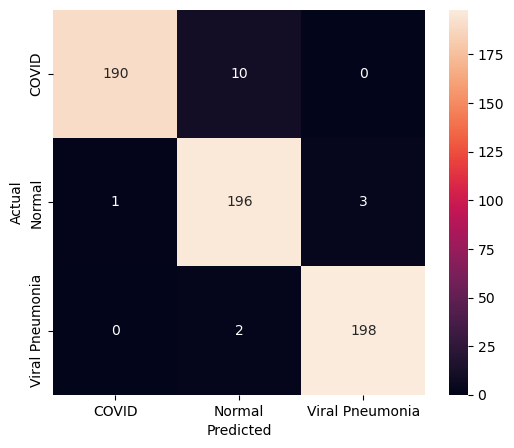

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(targets, preds)

plt.figure(figsize=(6,5))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    xticklabels=train_dataset.classes,
    yticklabels=train_dataset.classes
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [6]:
all_preds = preds
all_targets = targets

In [7]:
torch.softmax(outputs, dim=1)

tensor([[4.8679e-08, 2.4152e-08, 1.0000e+00],
        [1.4156e-06, 2.3245e-08, 1.0000e+00],
        [1.3609e-04, 9.5622e-07, 9.9986e-01],
        [1.3750e-05, 1.6739e-06, 9.9998e-01],
        [1.4529e-07, 3.5845e-08, 1.0000e+00],
        [5.4733e-05, 9.1513e-05, 9.9985e-01],
        [8.3897e-05, 9.7388e-07, 9.9992e-01],
        [3.4471e-07, 1.8622e-07, 1.0000e+00],
        [3.7201e-06, 1.7959e-06, 9.9999e-01],
        [8.7382e-07, 8.0784e-08, 1.0000e+00],
        [2.8210e-05, 5.7799e-06, 9.9997e-01],
        [8.3626e-06, 1.7098e-07, 9.9999e-01],
        [1.4249e-03, 1.1435e-04, 9.9846e-01],
        [1.0101e-05, 4.5839e-05, 9.9994e-01],
        [2.8240e-06, 4.8255e-06, 9.9999e-01],
        [2.5591e-07, 1.6315e-05, 9.9998e-01],
        [8.9903e-06, 4.1691e-06, 9.9999e-01],
        [5.1578e-04, 1.9609e-04, 9.9929e-01],
        [4.2770e-05, 2.5561e-05, 9.9993e-01],
        [4.0832e-07, 1.3018e-07, 1.0000e+00],
        [8.8214e-07, 7.2262e-06, 9.9999e-01],
        [2.1711e-04, 2.9103e-05, 9

In [4]:
model.load_state_dict(
    torch.load("best_densenet121.pth")
)

model.eval()

NameError: name 'model' is not defined

In [9]:
preds = []
targets = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)

        outputs = model(images)

        pred = outputs.argmax(1)

        preds.extend(pred.cpu().numpy())
        targets.extend(labels.numpy())

In [10]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("Accuracy:", accuracy_score(targets,preds))
print("Precision:", precision_score(
    targets,preds,
    average="weighted"
))
print("Recall:", recall_score(
    targets,preds,
    average="weighted"
))
print("F1:", f1_score(
    targets,preds,
    average="weighted"
))

Accuracy: 0.9862068965517241
Precision: 0.9862998523097045
Recall: 0.9862068965517241
F1: 0.9862222047271646


In [11]:
print("Train:", len(train_dataset))
print("Val:", len(val_dataset))
print("Test:", len(test_dataset))

Train: 3000
Val: 600
Test: 435


In [12]:
print(train_dataset.root)
print(val_dataset.root)
print(test_dataset.root)

COVID_19_dataset/train
COVID_19_dataset/val
COVID_19_dataset/test


In [21]:
from sklearn.metrics import classification_report

print(
    classification_report(
        targets,
        preds,
        target_names=test_dataset.classes
    )
)

                 precision    recall  f1-score   support

          COVID       0.99      0.98      0.99       145
         Normal       0.97      0.99      0.98       145
Viral Pneumonia       0.99      0.99      0.99       145

       accuracy                           0.99       435
      macro avg       0.99      0.99      0.99       435
   weighted avg       0.99      0.99      0.99       435



In [14]:
wrong = sum(p != t for p, t in zip(preds, targets))
print("Wrong:", wrong)
print("Total:", len(targets))

Wrong: 6
Total: 435


In [15]:
train_accs = [...]
val_accs = [...]

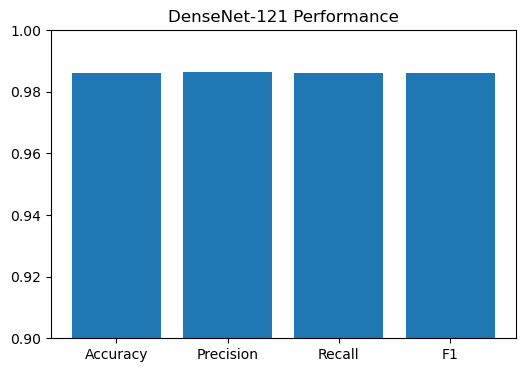

In [17]:
metrics = {
    "Accuracy": 0.9862,
    "Precision": 0.9863,
    "Recall": 0.9862,
    "F1": 0.9862
}

plt.figure(figsize=(6,4))

plt.bar(metrics.keys(), metrics.values())

plt.ylim(0.9, 1.0)

plt.title("DenseNet-121 Performance")

plt.show()

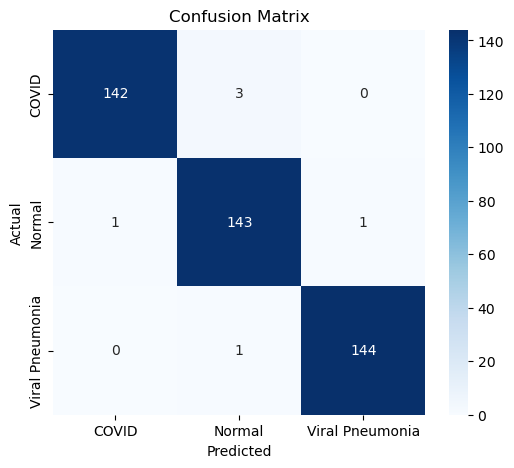

In [18]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(targets, preds)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=test_dataset.classes,
    yticklabels=test_dataset.classes
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")

plt.show()

In [ ]:
print(model.features)


NameError: name 'model' is not defined

In [ ]:
print(model)

NameError: name 'model' is not defined

In [24]:
model.features.denseblock4

_DenseBlock(
  (denselayer1): _DenseLayer(
    (norm1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (denselayer2): _DenseLayer(
    (norm1): BatchNorm2d(544, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv1): Conv2d(544, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (denselayer3): _DenseLayer(
    (norm1): BatchNorm2d(576, eps=1e-05, moment

In [25]:
%pip install grad-cam

     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     - -------------------------------------- 0.3/7.8 MB ? eta -:--:--
     - -------------------------------------- 0.3/7.8 MB ? eta -:--:--
     - -------------------------------------- 0.3/7.8 MB ? eta -:--:--
     -- ------------------------------------- 0.5/7.8 MB 316.6 kB/s eta 0:00:23
     -- ------------------------------------- 0.5/7.8 MB 316.6 kB/s eta 0:00:23
     -- ------------------------------------- 0.5/7.8 MB 316.6 kB/s eta 0:00:23
     ---- ----------------------------------- 0.8/7.8 MB 390.1 kB/s eta 0:00:18
     ---- -------------------------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ultralytics 8.4.18 requires ultralytics-thop>=2.0.18, which is not installed.


In [4]:
import torch
import torch.nn as nn
from torchvision import models

# Recreate architecture
model = models.densenet121(
    weights=None
)

num_features = model.classifier.in_features

model.classifier = nn.Linear(
    num_features,
    3
)

# Load weights
model.load_state_dict(
    torch.load(
        "best_densenet121.pth",
        map_location=device
    )
)

model = model.to(device)

model.eval()

C:\Users\sidha\AppData\Local\Temp\ipykernel_35728\2938704011.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [1]:
import torch

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print(device)

cuda


In [2]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

import numpy as np
import matplotlib.pyplot as plt

In [4]:
target_layers = [model.features.norm5]

In [7]:
img, label = test_dataset[0]

input_tensor = img.unsqueeze(0).to(device)

print("True:", test_dataset.classes[label])

True: COVID


In [3]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


DATA_DIR = "COVID_19_dataset"
BATCH_SIZE = 32
EPOCHS = 20
NUM_CLASSES = 3
LR = 1e-4

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])


train_dataset = datasets.ImageFolder(
    f"{DATA_DIR}/train",
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    f"{DATA_DIR}/val",
    transform=val_transform
)

test_dataset = datasets.ImageFolder(
    f"{DATA_DIR}/test",
    transform=val_transform
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)
print(train_dataset.classes)
print(train_dataset.class_to_idx)

from collections import Counter
print(Counter(train_dataset.targets))


['COVID', 'Normal', 'Viral Pneumonia']
{'COVID': 0, 'Normal': 1, 'Viral Pneumonia': 2}
Counter({0: 1000, 1: 1000, 2: 1000})


In [7]:
img, label = test_dataset[0]

input_tensor = img.unsqueeze(0).to(device)

with torch.no_grad():
    output = model(input_tensor)

pred_class = output.argmax().item()

print("True:", test_dataset.classes[label])
print("Pred:", test_dataset.classes[pred_class])

True: COVID
Pred: COVID


In [9]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

import numpy as np
import matplotlib.pyplot as plt

In [8]:
target_layers = [model.features.norm5]

cam = GradCAM(
    model=model,
    target_layers=target_layers
)

targets = [ClassifierOutputTarget(pred_class)]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)[0]

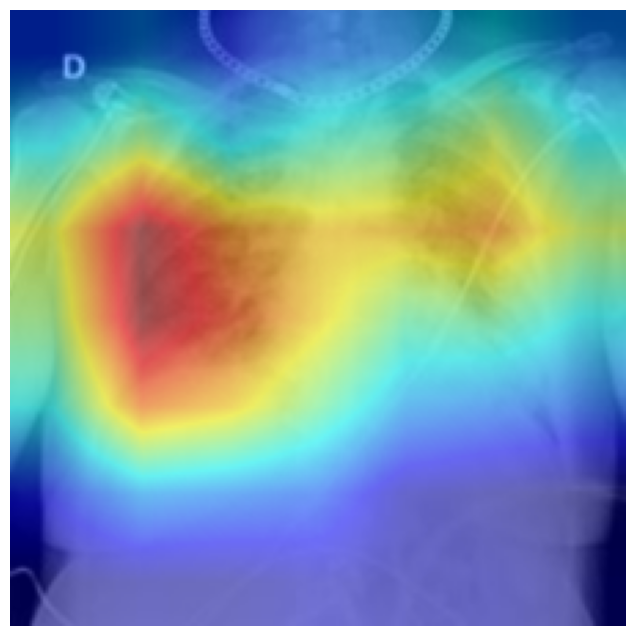

In [9]:
rgb_img = img.permute(1,2,0).cpu().numpy()

mean = np.array([0.485,0.456,0.406])
std = np.array([0.229,0.224,0.225])

rgb_img = rgb_img * std + mean
rgb_img = np.clip(rgb_img,0,1)

visualization = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)

plt.figure(figsize=(8,8))
plt.imshow(visualization)
plt.axis("off")
plt.show()

In [17]:
print(train_dataset.class_to_idx)

{'COVID': 0, 'Normal': 1, 'Viral Pneumonia': 2}



CLASS: COVID


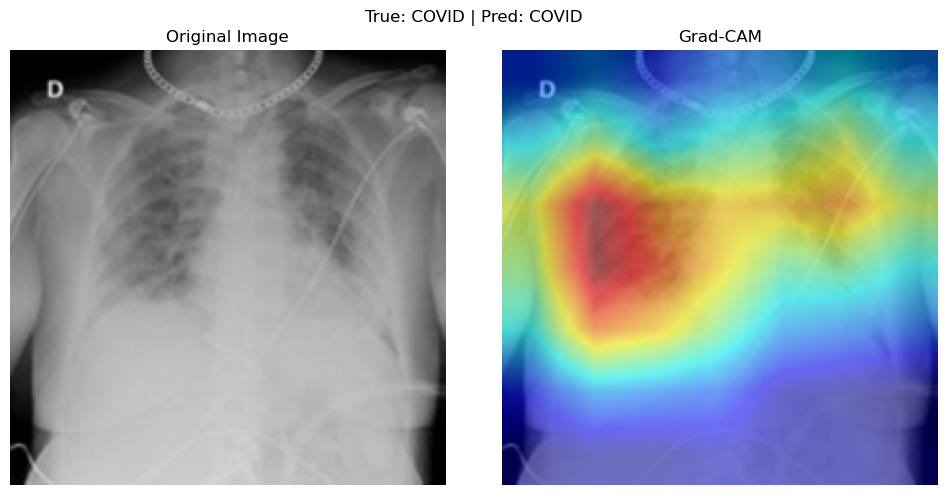

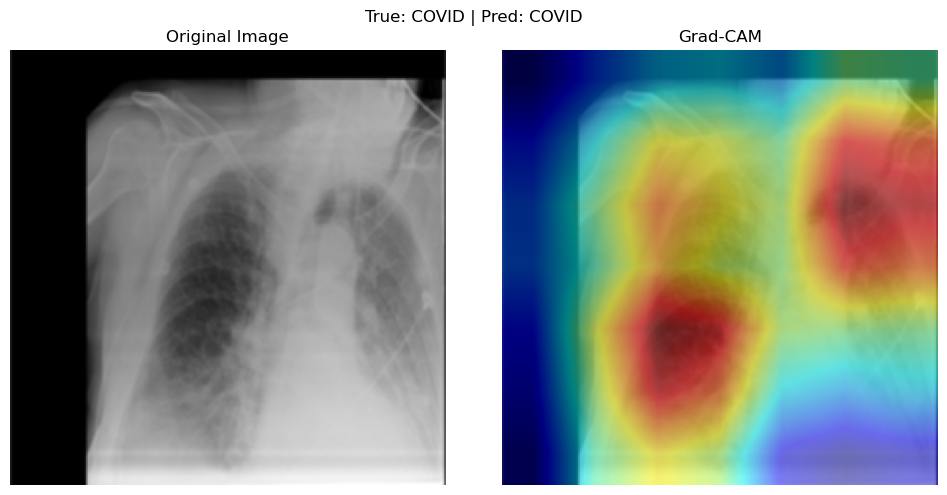

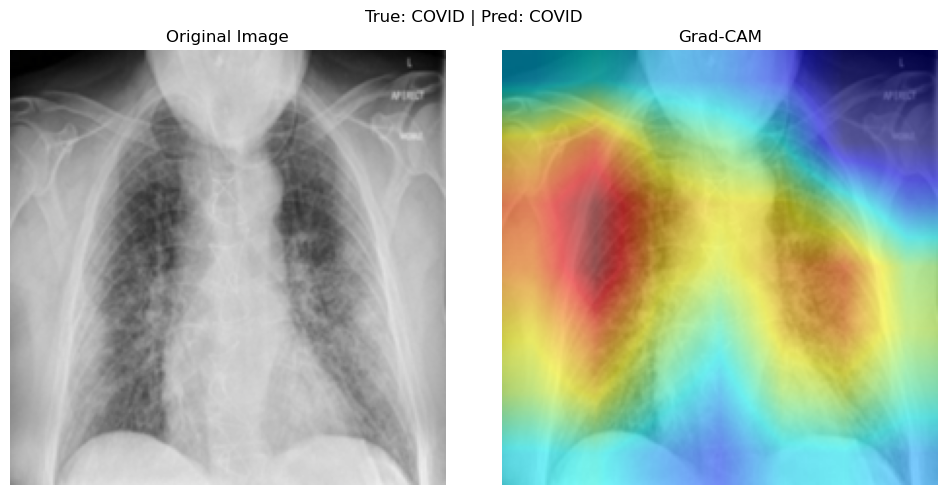

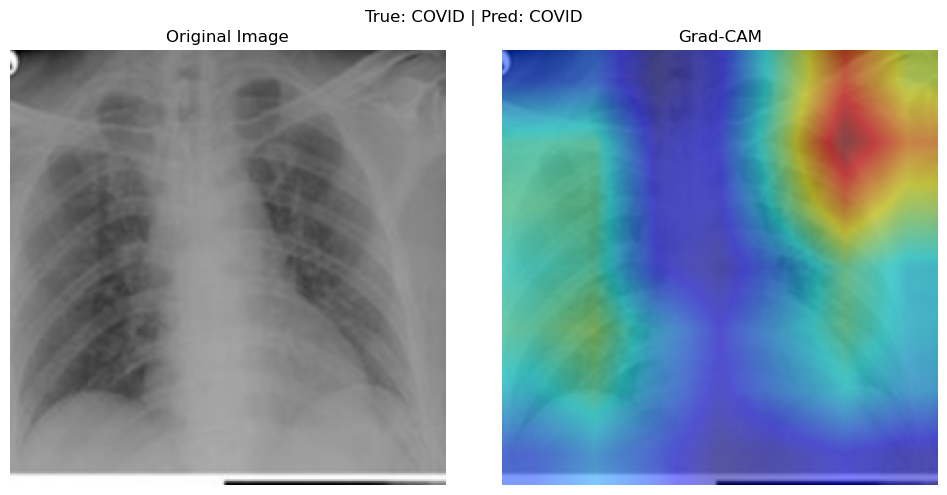

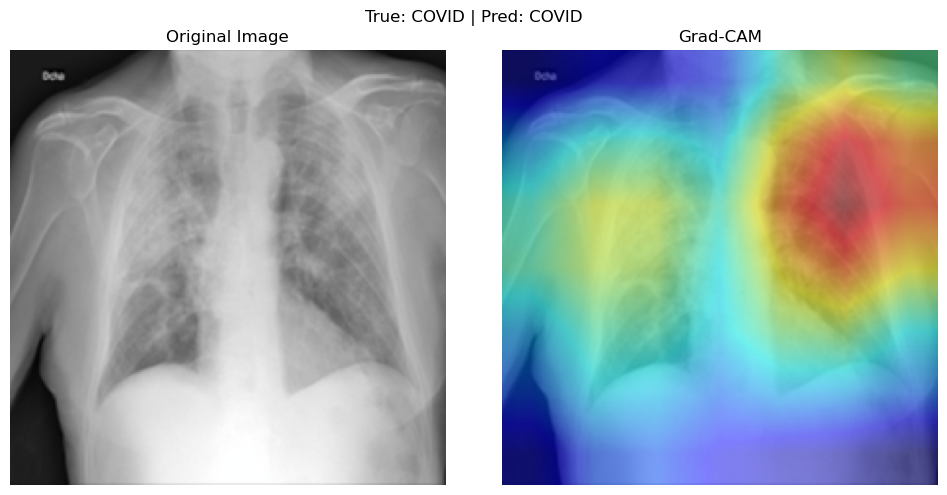

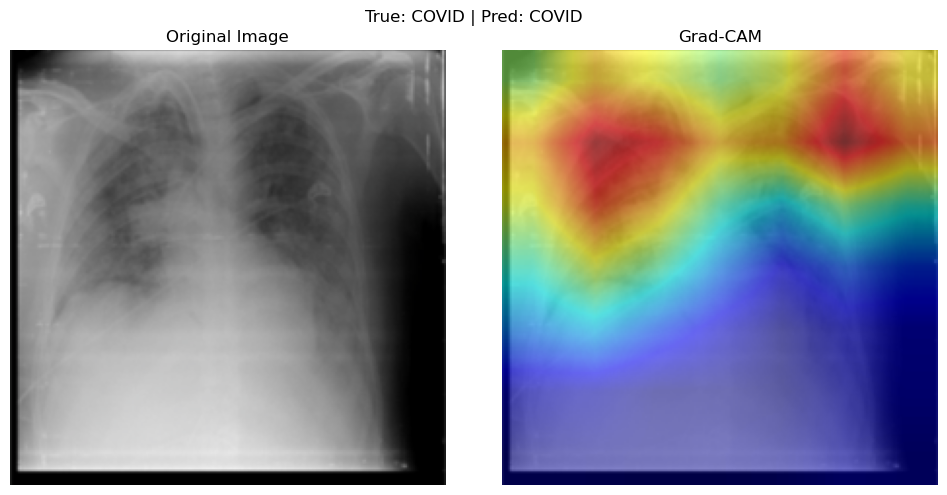

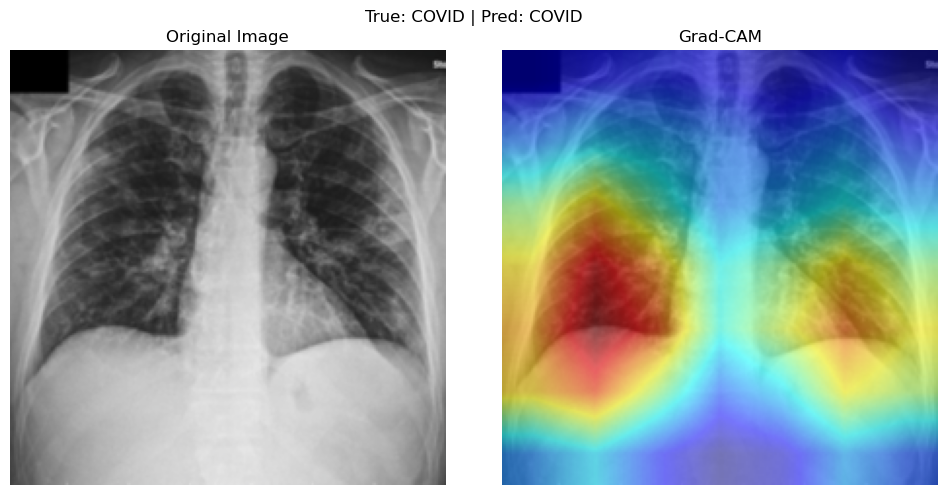

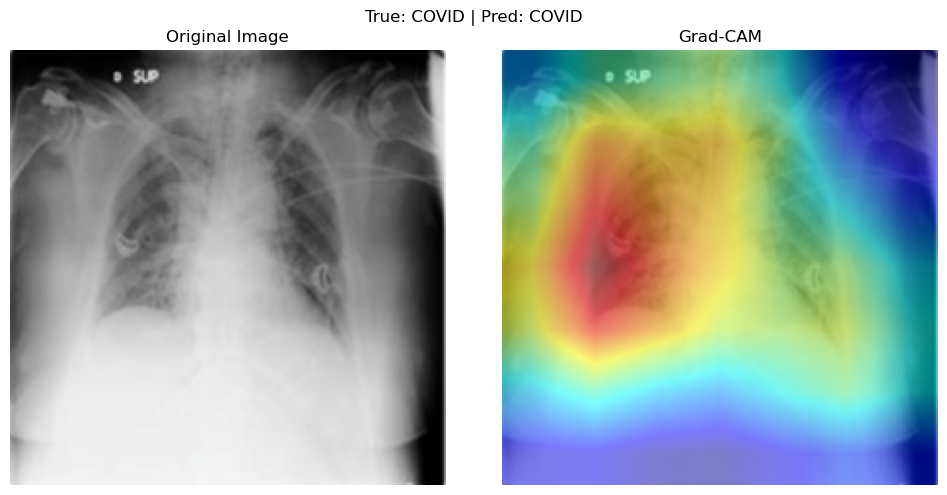

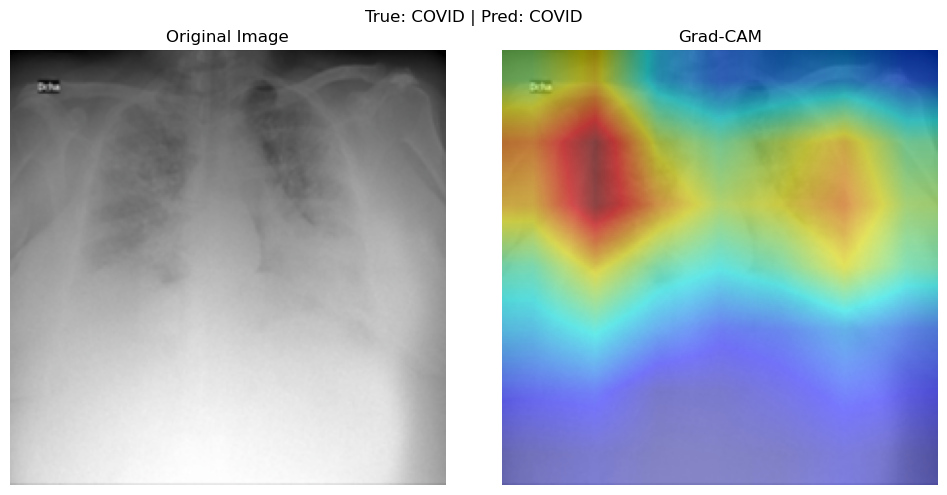

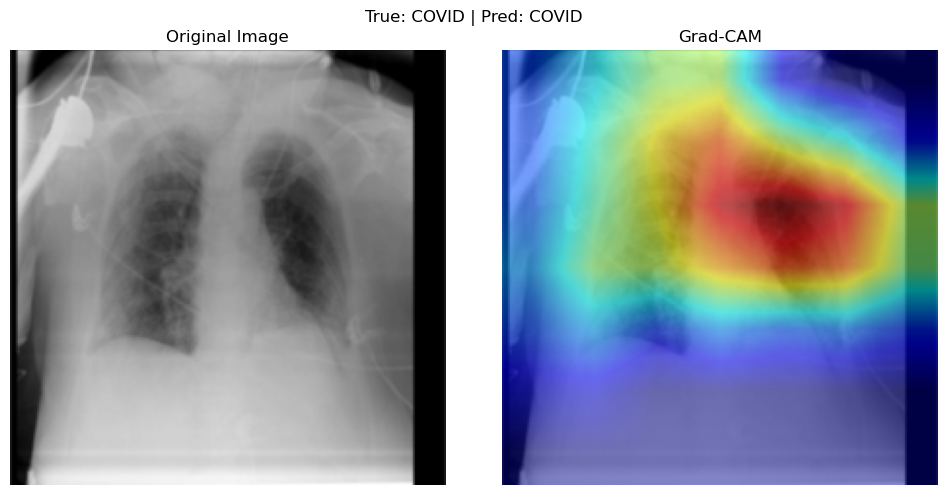


CLASS: Normal


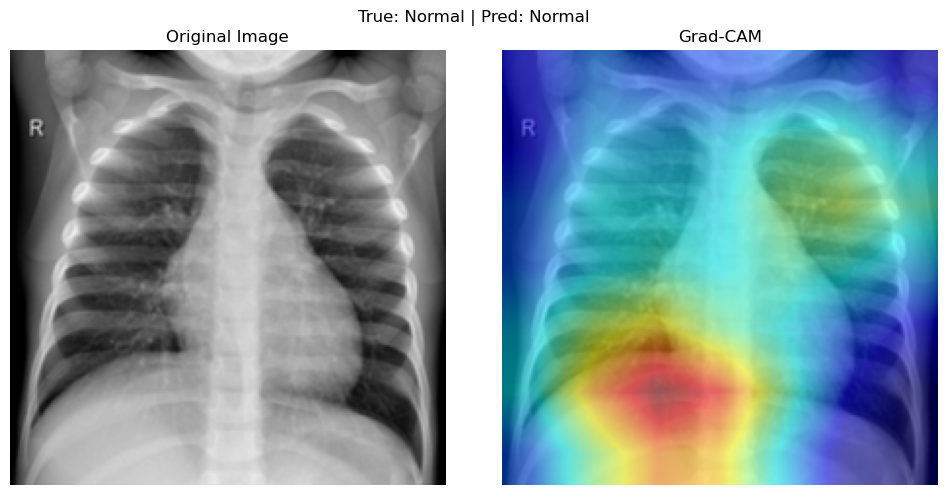

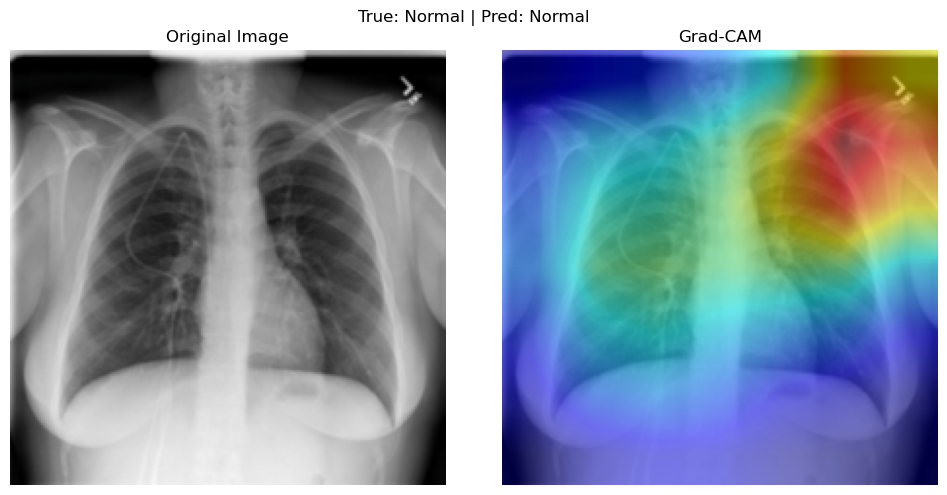

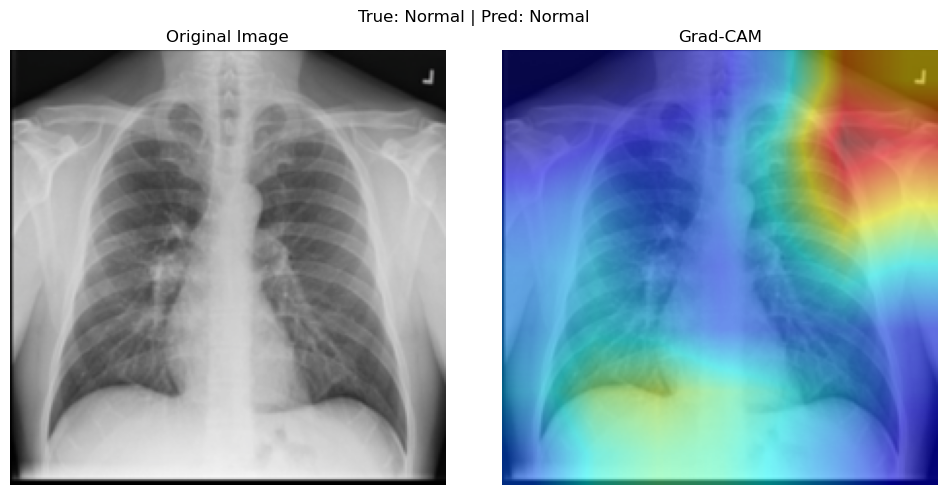

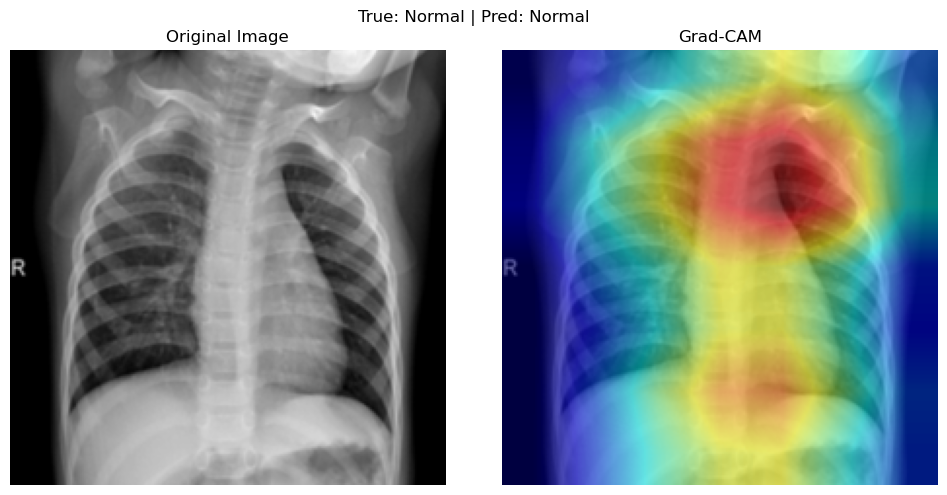

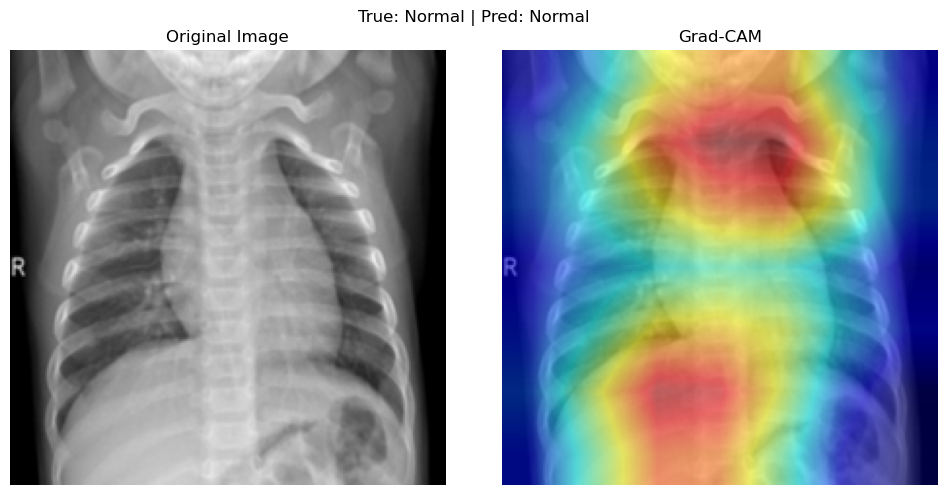

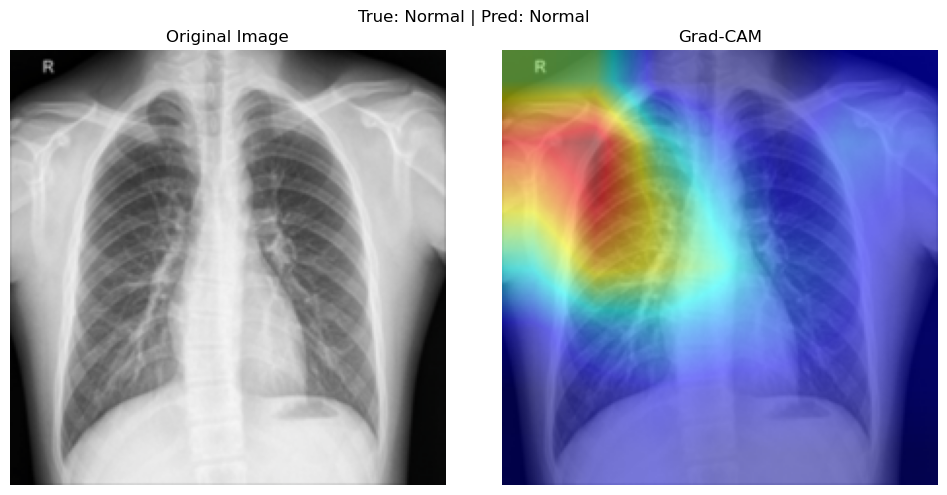

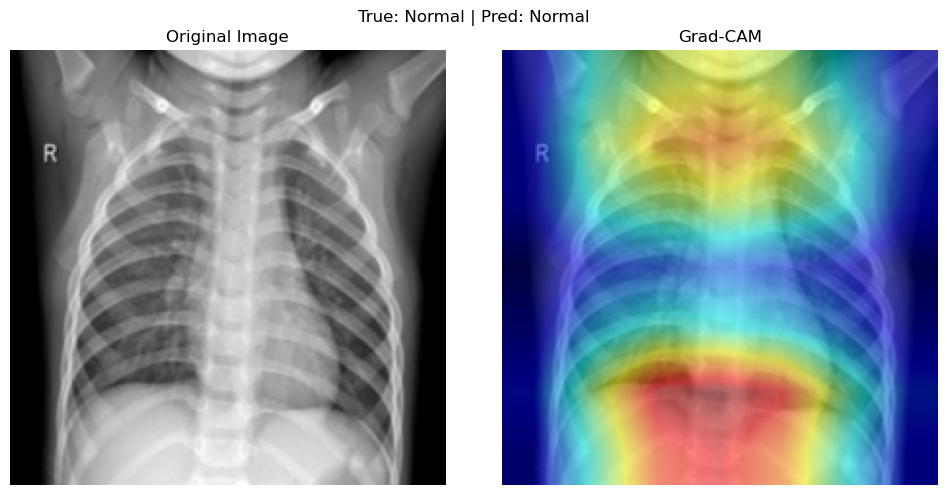

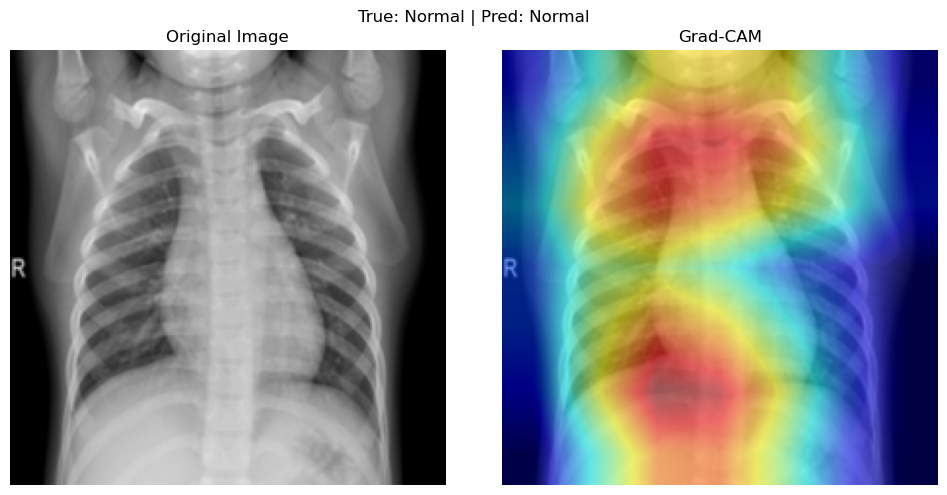

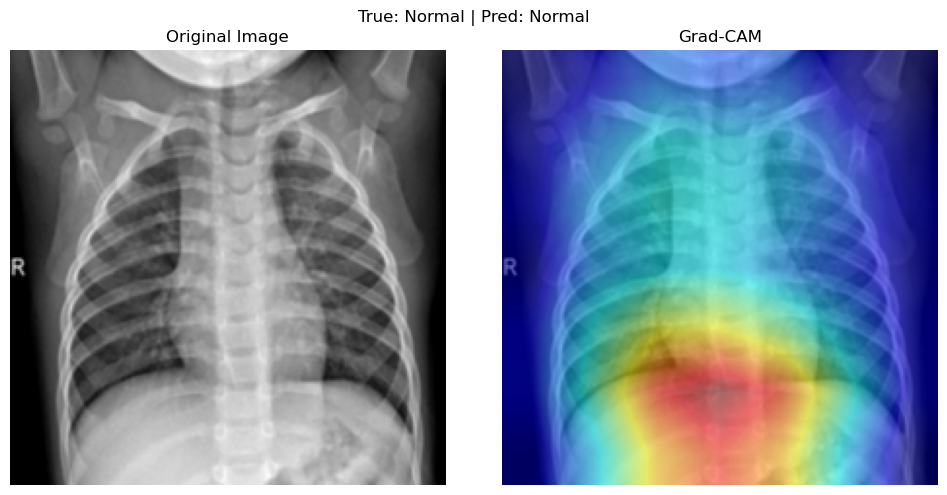

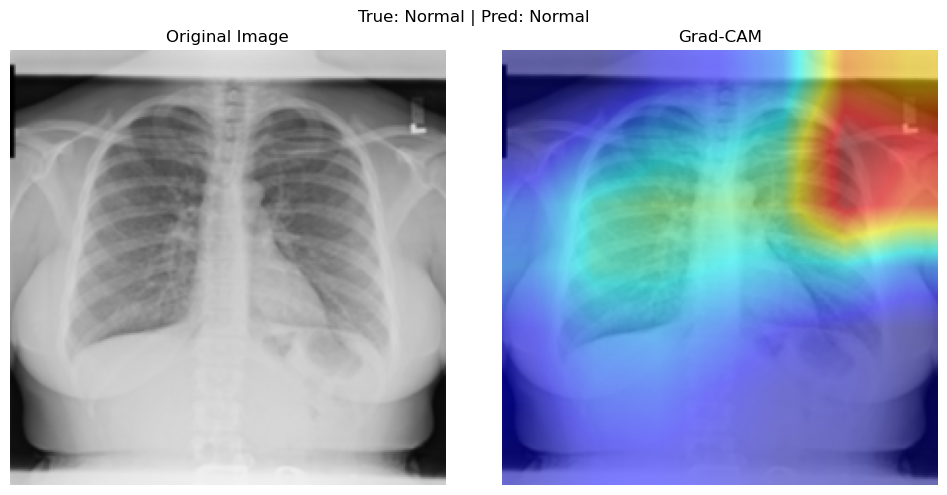


CLASS: Viral Pneumonia


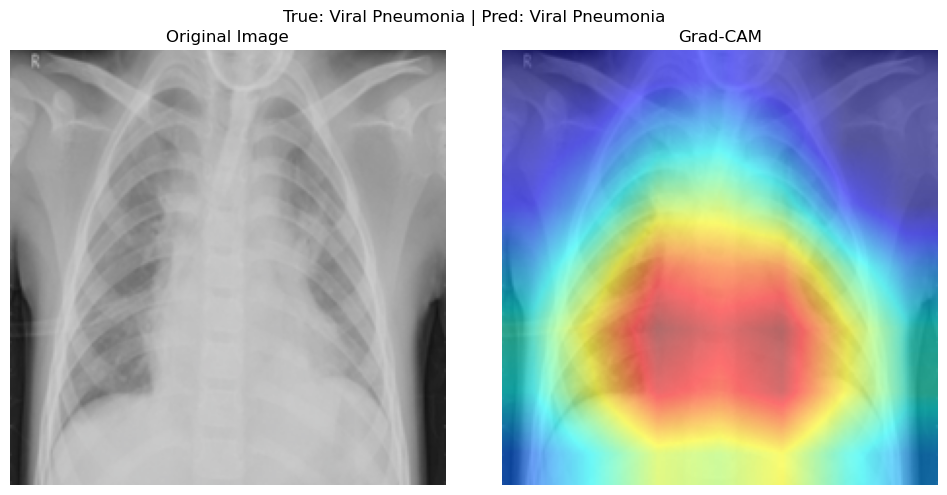

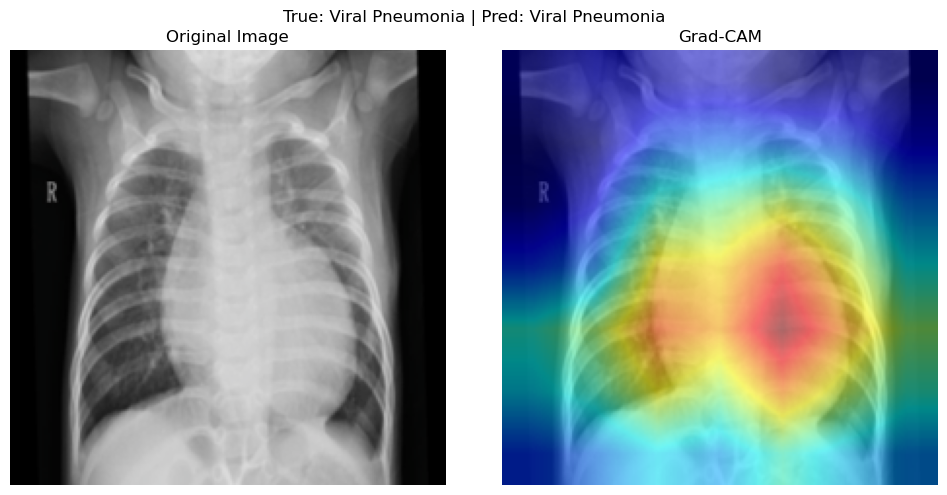

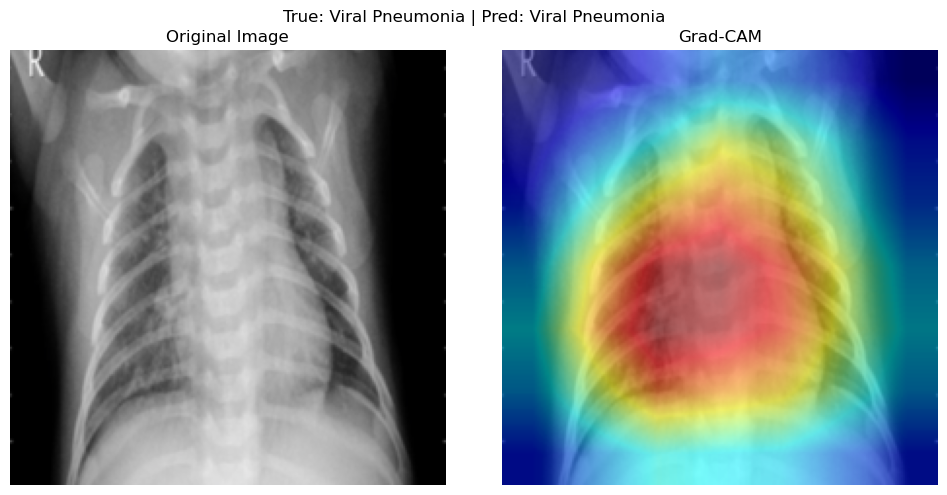

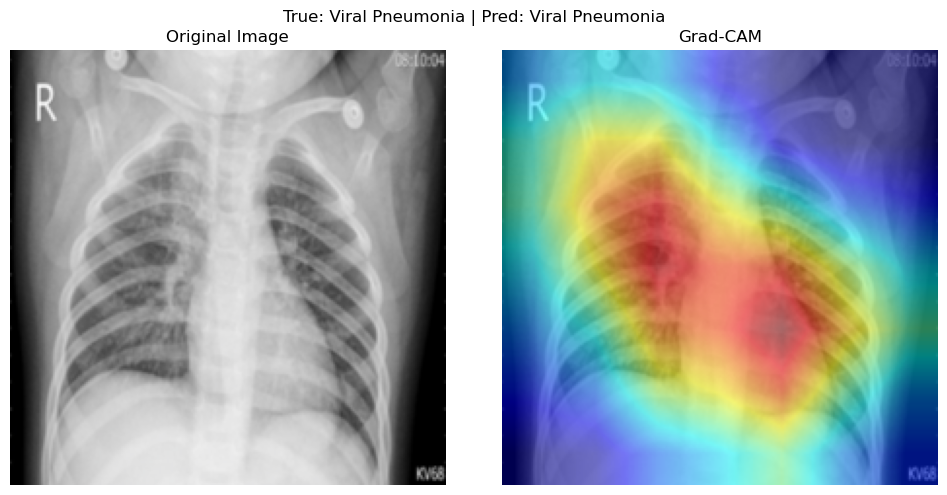

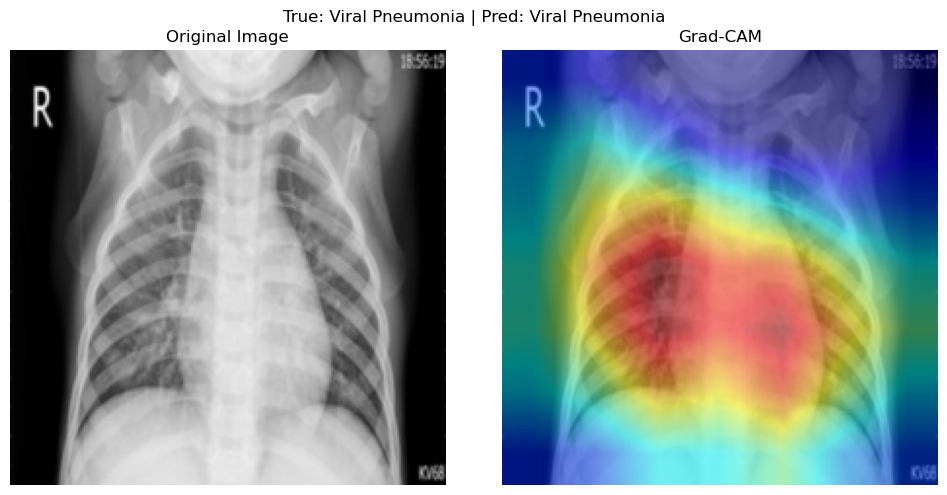

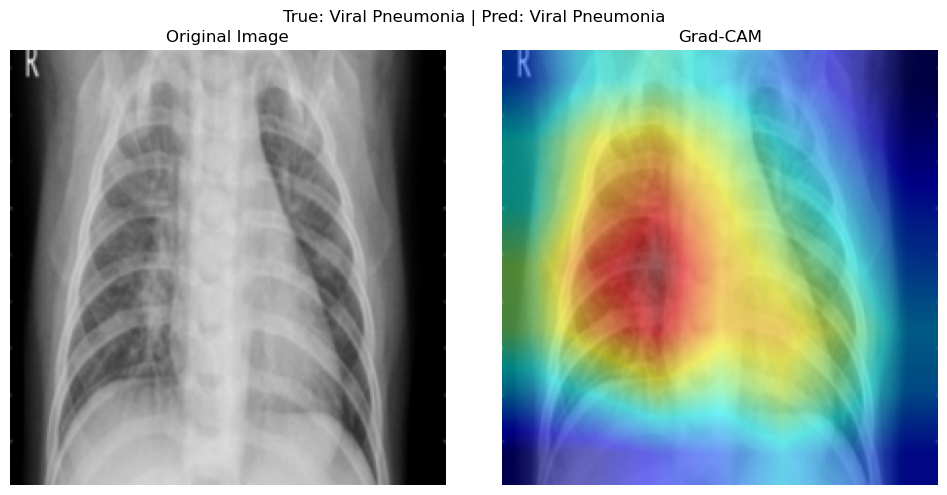

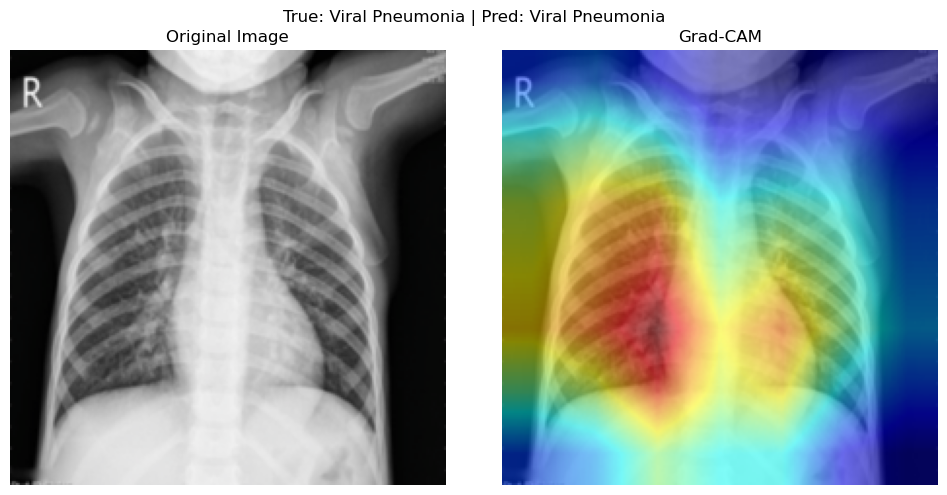

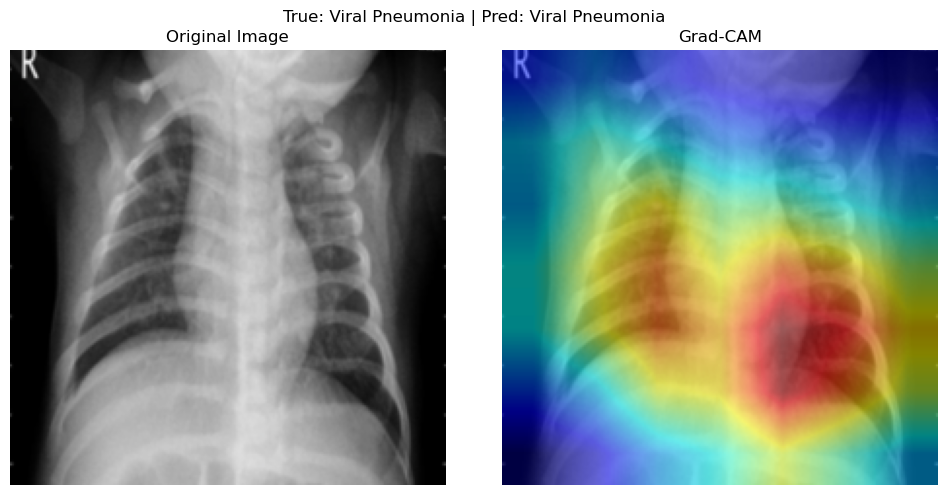

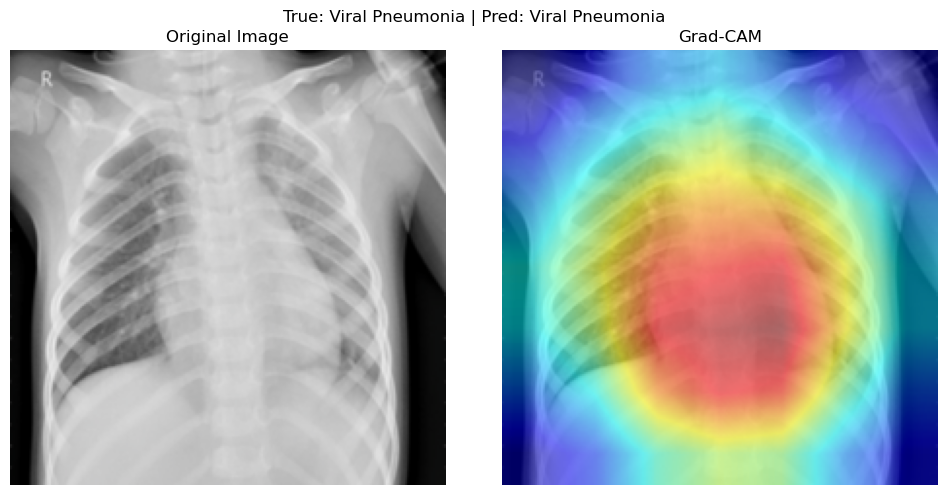

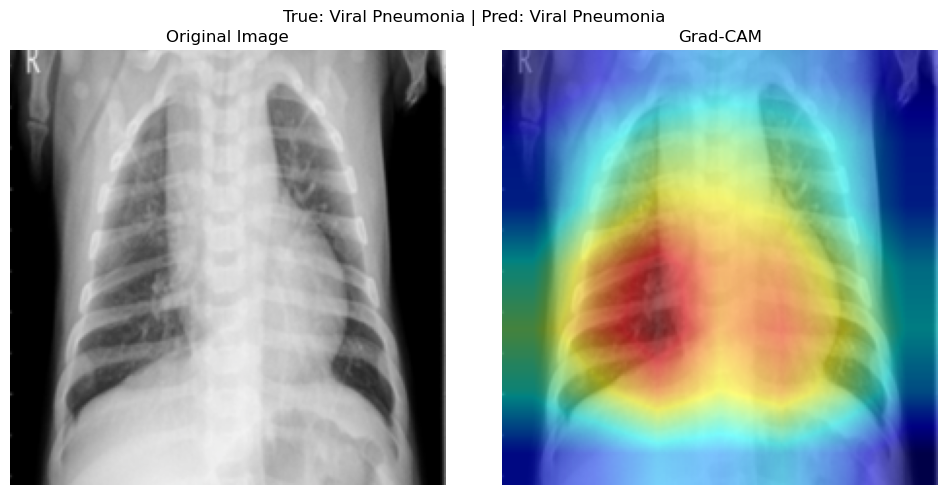

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt

from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


samples_per_class = 10

selected = {
    0: [],  
    1: [],  
    2: []   
}

model.eval()

for idx in range(len(test_dataset)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        pred = output.argmax(dim=1).item()

    if pred == label:

        if len(selected[label]) < samples_per_class:
            selected[label].append(idx)

    if all(len(v) >= samples_per_class for v in selected.values()):
        break




mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])

for class_id, indices in selected.items():

    print("\n" + "="*60)
    print(f"CLASS: {train_dataset.classes[class_id]}")
    print("="*60)

    for idx in indices:

        img, label = test_dataset[idx]

        input_tensor = img.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_tensor)
            pred_class = output.argmax(dim=1).item()

        targets = [ClassifierOutputTarget(pred_class)]

        grayscale_cam = cam(
            input_tensor=input_tensor,
            targets=targets
        )[0]

        

        rgb_img = img.permute(1,2,0).cpu().numpy()

        rgb_img = rgb_img * std + mean
        rgb_img = np.clip(rgb_img, 0, 1)

        

        visualization = show_cam_on_image(
            rgb_img,
            grayscale_cam,
            use_rgb=True
        )



        fig, ax = plt.subplots(1, 2, figsize=(10, 5))

        ax[0].imshow(rgb_img)
        ax[0].set_title("Original Image")
        ax[0].axis("off")

        ax[1].imshow(visualization)
        ax[1].set_title("Grad-CAM")
        ax[1].axis("off")

        plt.suptitle(
            f"True: {train_dataset.classes[label]} | "
            f"Pred: {train_dataset.classes[pred_class]}"
        )

        plt.tight_layout()
        plt.show()

[(29, 0, 1), (51, 0, 1), (125, 0, 1), (154, 1, 0), (163, 1, 2)]


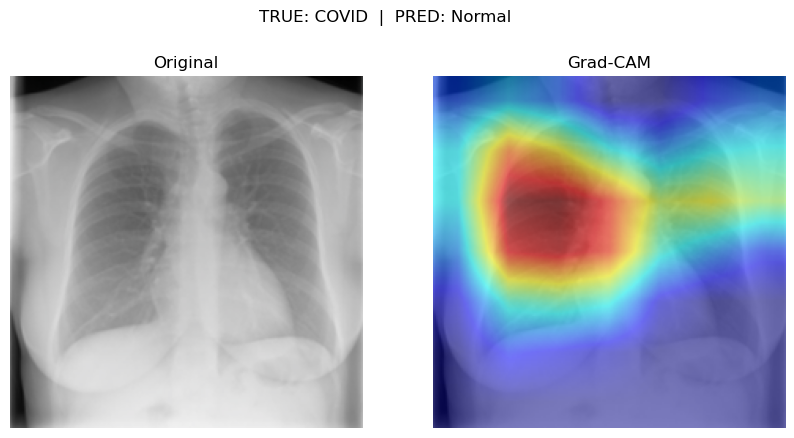

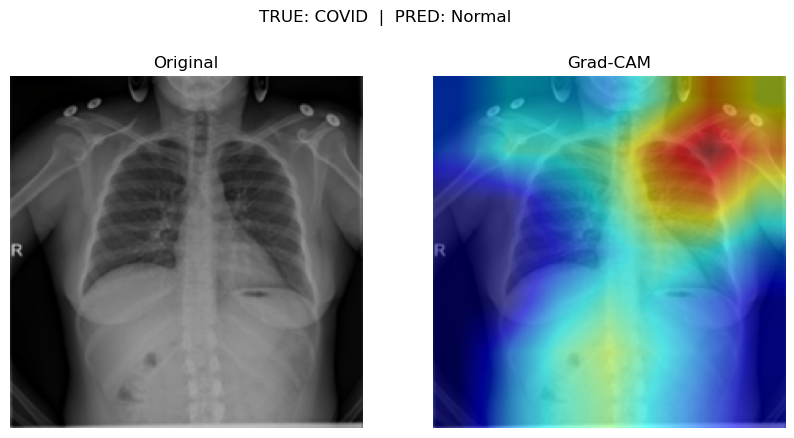

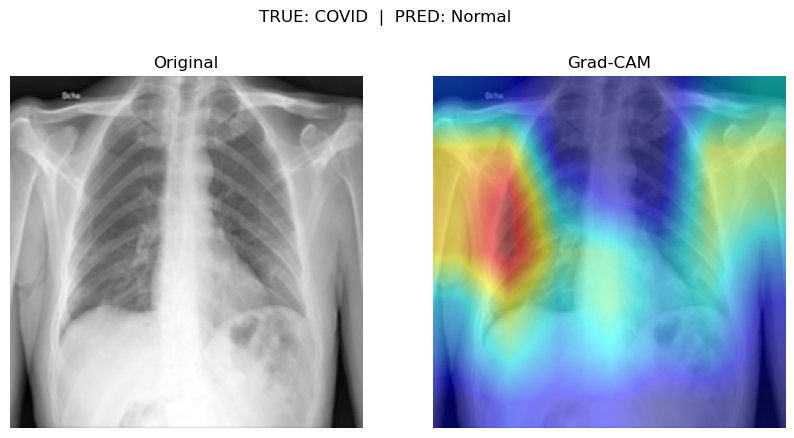

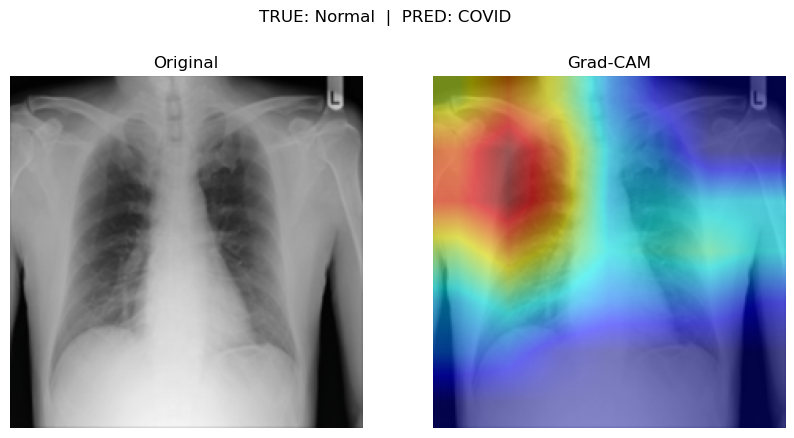

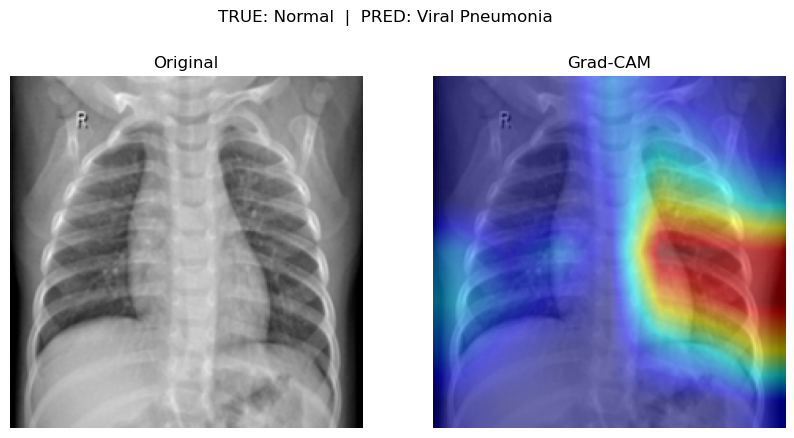

In [19]:
misclassified = []

for idx in range(len(test_dataset)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred = model(input_tensor).argmax(1).item()

    if pred != label:
        misclassified.append((idx, label, pred))

    if len(misclassified) == 5:
        break

print(misclassified)
for idx, true_label, pred_label in misclassified:

    img, _ = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    targets = [ClassifierOutputTarget(pred_label)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    rgb_img = img.permute(1,2,0).cpu().numpy()

    mean = np.array([0.485,0.456,0.406])
    std = np.array([0.229,0.224,0.225])

    rgb_img = rgb_img * std + mean
    rgb_img = np.clip(rgb_img,0,1)

    visualization = show_cam_on_image(
        rgb_img,
        grayscale_cam,
        use_rgb=True
    )

    fig, ax = plt.subplots(1,2,figsize=(10,5))

    ax[0].imshow(rgb_img)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(visualization)
    ax[1].set_title("Grad-CAM")
    ax[1].axis("off")

    plt.suptitle(
        f"TRUE: {train_dataset.classes[true_label]}  |  "
        f"PRED: {train_dataset.classes[pred_label]}"
    )

    plt.show()

In [16]:
import numpy as np

def compute_entropy(cam):

    cam = cam.astype(np.float64)

    cam = cam - cam.min()

    if cam.max() > 0:
        cam = cam / cam.max()

    prob = cam.flatten()

    prob = prob / (prob.sum() + 1e-12)

    entropy = -np.sum(
        prob * np.log2(prob + 1e-12)
    )

    return entropy

In [16]:
entropy = compute_entropy(grayscale_cam)

print(f"Entropy: {entropy:.4f}")

Entropy: 15.4059


In [65]:
entropies = []

for idx in range(435):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_class = model(input_tensor).argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    entropies.append(
        compute_entropy(grayscale_cam)
    )

print("Average Entropy:", np.mean(entropies))
print("Std Entropy:", np.std(entropies))

Average Entropy: 15.27212411980242
Std Entropy: 0.16308568263238205


In [24]:
entropy_results = []

for idx in range(len(test_dataset)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_class = model(input_tensor).argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    ent = compute_entropy(grayscale_cam)

    entropy_results.append({
        "idx": idx,
        "entropy": ent,
        "label": label,
        "pred": pred_class
    })

In [25]:
entropy_results = sorted(
    entropy_results,
    key=lambda x: x["entropy"]
)

lowest = entropy_results[:5]
highest = entropy_results[-5:]

In [17]:
def show_sample(idx):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_class = model(input_tensor).argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    rgb_img = img.permute(1,2,0).cpu().numpy()

    mean = np.array([0.485,0.456,0.406])
    std = np.array([0.229,0.224,0.225])

    rgb_img = rgb_img * std + mean
    rgb_img = np.clip(rgb_img,0,1)

    visualization = show_cam_on_image(
        rgb_img,
        grayscale_cam,
        use_rgb=True
    )

    print(f"Entropy = {compute_entropy(grayscale_cam):.4f}")

    fig, ax = plt.subplots(1,2,figsize=(10,5))

    ax[0].imshow(rgb_img)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(visualization)
    ax[1].set_title("Grad-CAM")
    ax[1].axis("off")

    plt.show()

LOWEST ENTROPY
Entropy = 14.3477


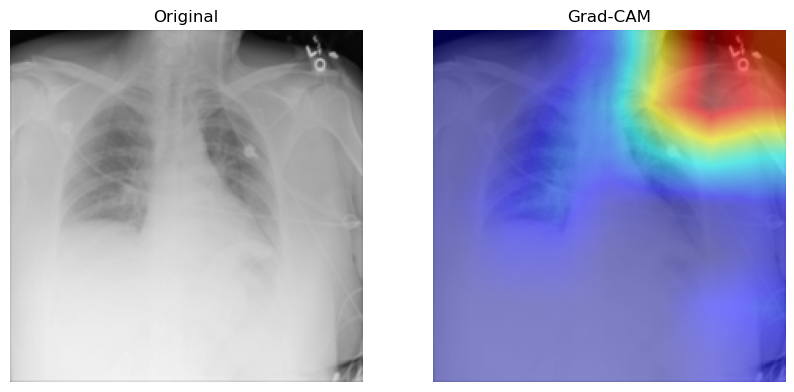

Entropy = 14.6540


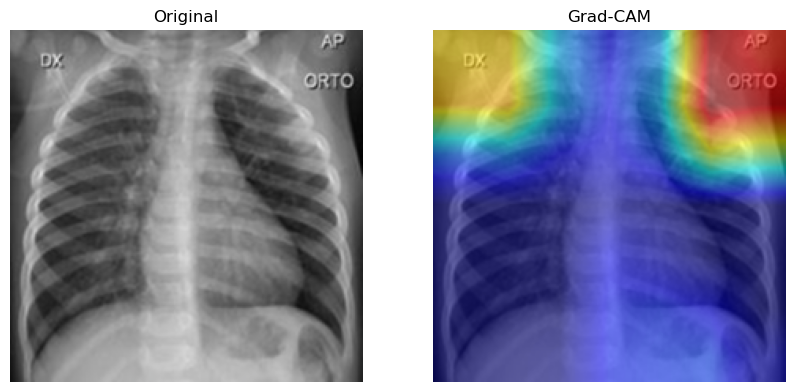

Entropy = 14.6962


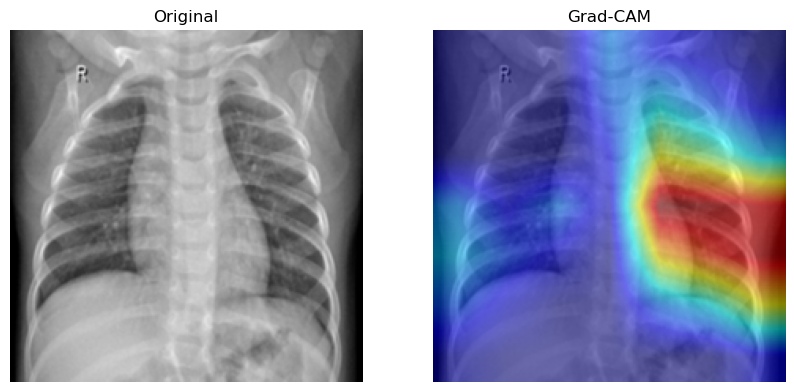

Entropy = 14.7279


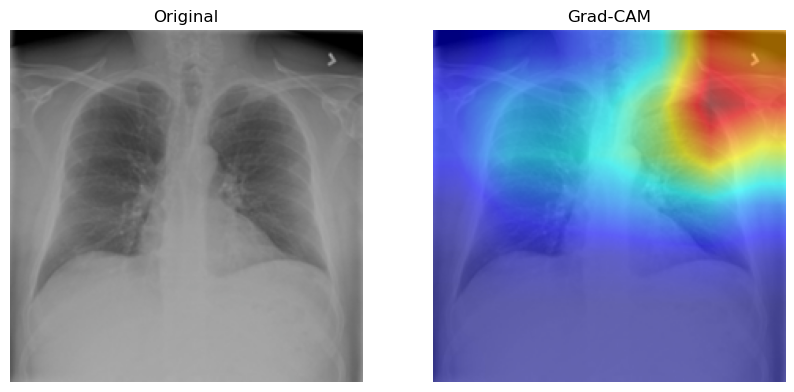

Entropy = 14.7296


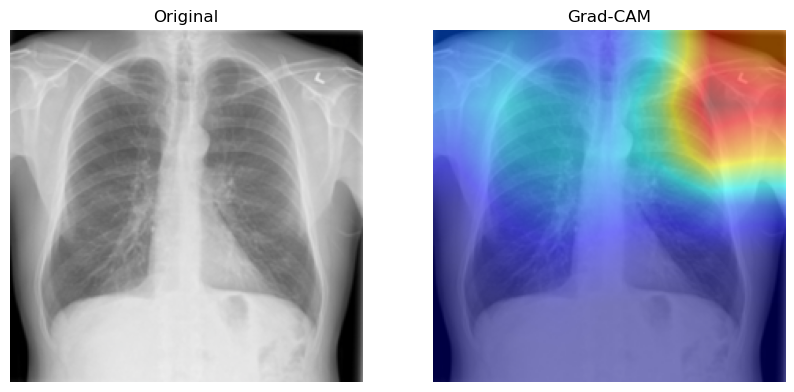

HIGHEST ENTROPY
Entropy = 15.4698


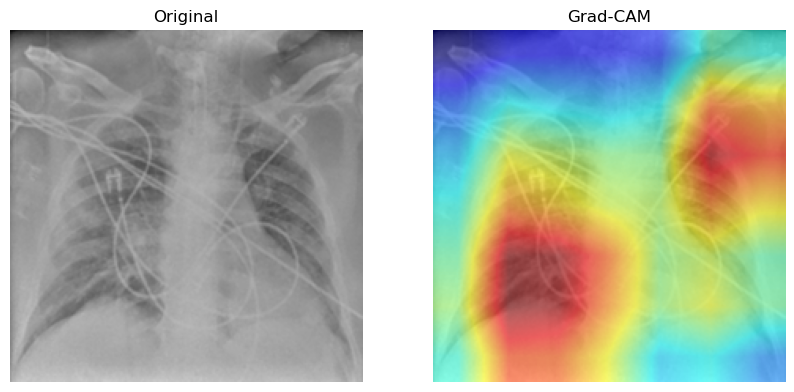

Entropy = 15.4748


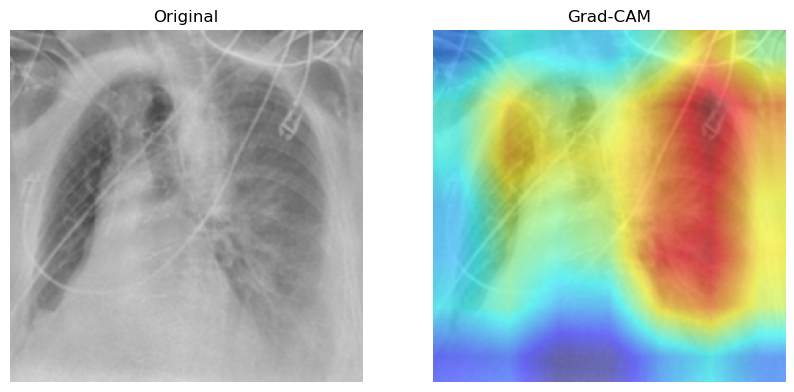

Entropy = 15.4769


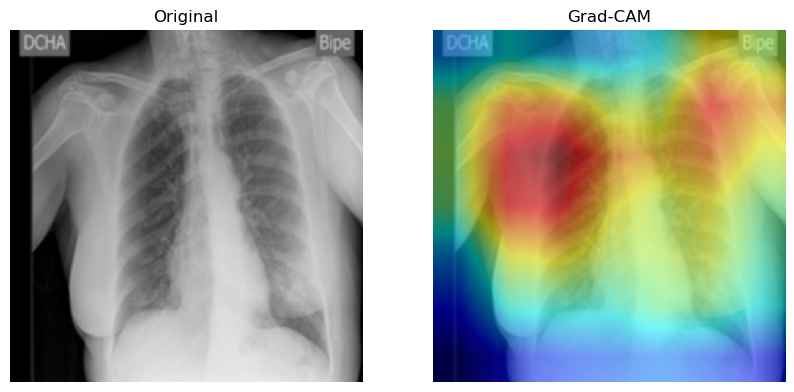

Entropy = 15.4809


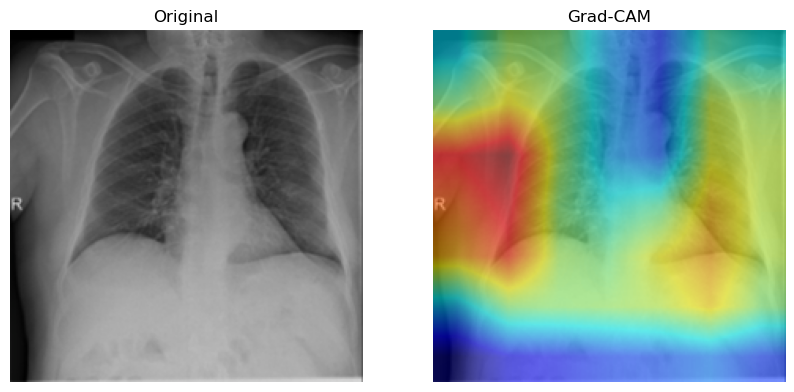

Entropy = 15.4942


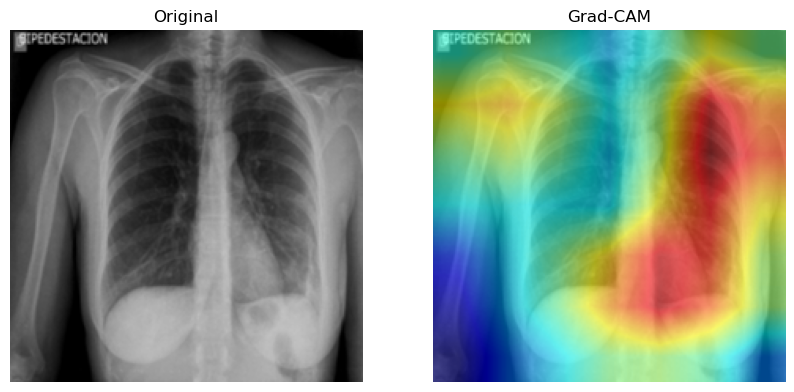

In [27]:
print("LOWEST ENTROPY")
for item in lowest:
    show_sample(item["idx"])

print("HIGHEST ENTROPY")
for item in highest:
    show_sample(item["idx"])

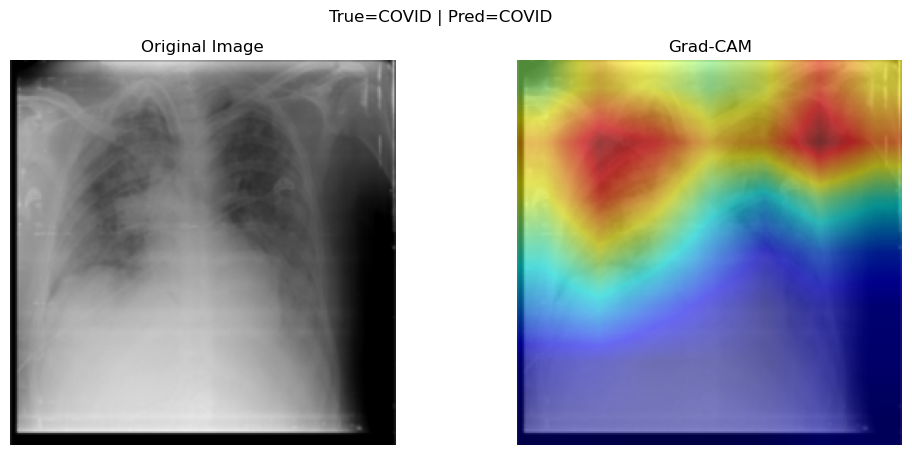

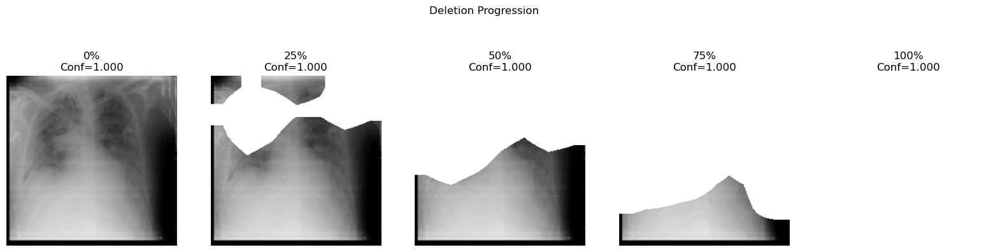

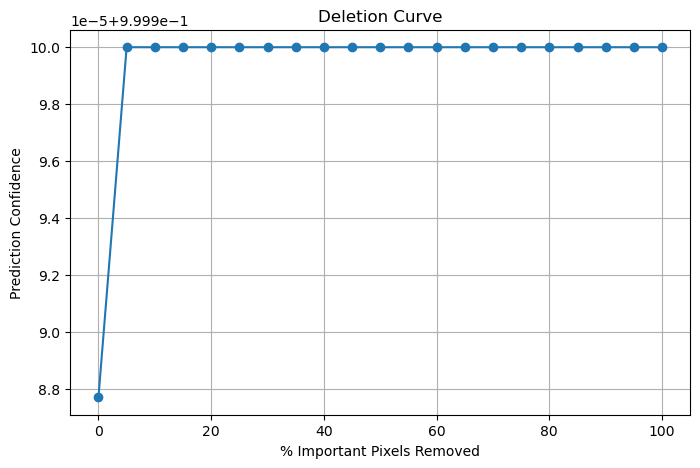

Initial Confidence: 1.0000
Final Confidence: 1.0000


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image



idx = 5

img, label = test_dataset[idx]

input_tensor = img.unsqueeze(0).to(device)

with torch.no_grad():
    logits = model(input_tensor)
    pred_class = logits.argmax(1).item()



targets = [ClassifierOutputTarget(pred_class)]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)[0]


mean = np.array([0.485,0.456,0.406])
std  = np.array([0.229,0.224,0.225])

rgb_img = img.permute(1,2,0).cpu().numpy()
rgb_img = rgb_img * std + mean
rgb_img = np.clip(rgb_img,0,1)

gradcam_vis = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)



cam_flat = grayscale_cam.flatten()

sorted_idx = np.argsort(cam_flat)[::-1]

h, w = grayscale_cam.shape



steps = 20

confidences = []

snapshots = {}

for step in range(steps + 1):

    frac = step / steps

    modified_img = img.clone()

    n_pixels = int(frac * len(sorted_idx))

    pixels_to_remove = sorted_idx[:n_pixels]

    rows = pixels_to_remove // w
    cols = pixels_to_remove % w

    modified_img[:, rows, cols] = 200

    modified_input = modified_img.unsqueeze(0).to(device)

    with torch.no_grad():

        output = model(modified_input)

        prob = torch.softmax(
            output,
            dim=1
        )[0, pred_class]

        confidences.append(prob.item())

    # Save snapshots
    if step in [0, 5, 10, 15, 20]:

        snap_rgb = modified_img.permute(1,2,0).cpu().numpy()
        snap_rgb = snap_rgb * std + mean
        snap_rgb = np.clip(snap_rgb,0,1)

        snapshots[step] = (
            snap_rgb,
            prob.item()
        )



fig, ax = plt.subplots(1,2,figsize=(12,5))

ax[0].imshow(rgb_img)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(gradcam_vis)
ax[1].set_title("Grad-CAM")
ax[1].axis("off")

plt.suptitle(
    f"True={train_dataset.classes[label]} | "
    f"Pred={train_dataset.classes[pred_class]}"
)

plt.show()



fig, axes = plt.subplots(
    1,
    5,
    figsize=(20,5)
)

titles = {
    0: "0%",
    5: "25%",
    10: "50%",
    15: "75%",
    20: "100%"
}

for ax, step in zip(axes, [0,5,10,15,20]):

    image, conf = snapshots[step]

    ax.imshow(image)

    ax.set_title(
        f"{titles[step]}\nConf={conf:.3f}"
    )

    ax.axis("off")

plt.suptitle("Deletion Progression")

plt.show()



x = np.linspace(
    0,
    100,
    steps + 1
)

plt.figure(figsize=(8,5))

plt.plot(
    x,
    confidences,
    marker="o"
)

plt.xlabel(
    "% Important Pixels Removed"
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "Deletion Curve"
)

plt.grid(True)

plt.show()

print(
    f"Initial Confidence: {confidences[0]:.4f}"
)

print(
    f"Final Confidence: {confidences[-1]:.4f}"
)

In [48]:
probs = torch.softmax(output, dim=1)[0]

for i, p in enumerate(probs):
    print(train_dataset.classes[i], p.item())

COVID 0.6865499019622803
Normal 0.07871946692466736
Viral Pneumonia 0.2347305864095688


tensor([[  82.8987,  -34.4475, -141.5092]], device='cuda:0')
tensor([[1., 0., 0.]], device='cuda:0')


100%|██████████| 435/435 [03:40<00:00,  1.98it/s]

AOPC: 0.5292 ± 0.3326
Deletion AUC: 0.4762



C:\Users\sidha\AppData\Local\Temp\ipykernel_20092\2700412156.py:99: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  deletion_auc = np.trapz(mean_curve, x)


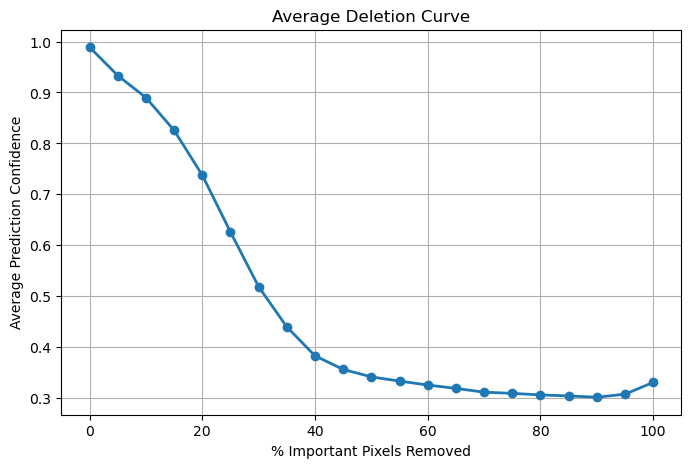

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

steps = 20
num_images = len(test_dataset)  

mean_curve = np.zeros(steps + 1)
all_aopc = []
for idx in tqdm(range(num_images)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(1).item()



    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam_pp(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    cam_flat = grayscale_cam.flatten()

    sorted_idx = np.argsort(cam_flat)[::-1]

    h, w = grayscale_cam.shape

    confidences = []


    for step in range(steps + 1):

        frac = step / steps

        modified_img = img.clone()

        n_pixels = int(frac * len(sorted_idx))

        pixels_to_remove = sorted_idx[:n_pixels]

        rows = pixels_to_remove // w
        cols = pixels_to_remove % w

        # perturbation baseline
        modified_img[:, rows, cols] = -3

        modified_input = modified_img.unsqueeze(0).to(device)

        with torch.no_grad():

            output = model(modified_input)

            prob = torch.softmax(
                output,
                dim=1
            )[0, pred_class]

            confidences.append(prob.item())
    confidences = np.array(confidences)

    original_conf = confidences[0]

    drops = original_conf - confidences[1:]

    image_aopc = np.mean(drops)

    all_aopc.append(image_aopc)
    mean_curve += np.array(confidences)


mean_curve /= num_images
mean_aopc = np.mean(all_aopc)
std_aopc = np.std(all_aopc)

print(f"AOPC: {mean_aopc:.4f} ± {std_aopc:.4f}")



x = np.linspace(0, 1, steps + 1)

deletion_auc = np.trapz(mean_curve, x)

print(f"Deletion AUC: {deletion_auc:.4f}")



plt.figure(figsize=(8,5))

plt.plot(
    x * 100,
    mean_curve,
    marker="o",
    linewidth=2
)

plt.xlabel("% Important Pixels Removed")
plt.ylabel("Average Prediction Confidence")
plt.title("Average Deletion Curve")

plt.grid(True)

plt.show()

In [54]:
confidences = np.array(confidences)

original_conf = confidences[0]

drops = original_conf - confidences

aopc = np.mean(drops)

print(f"AOPC = {aopc:.4f}")

AOPC = -0.2925


100%|██████████| 435/435 [03:27<00:00,  2.09it/s]

Insertion AUC: 0.8316



C:\Users\sidha\AppData\Local\Temp\ipykernel_20092\2958948358.py:88: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  insertion_auc = np.trapz(mean_curve, x)


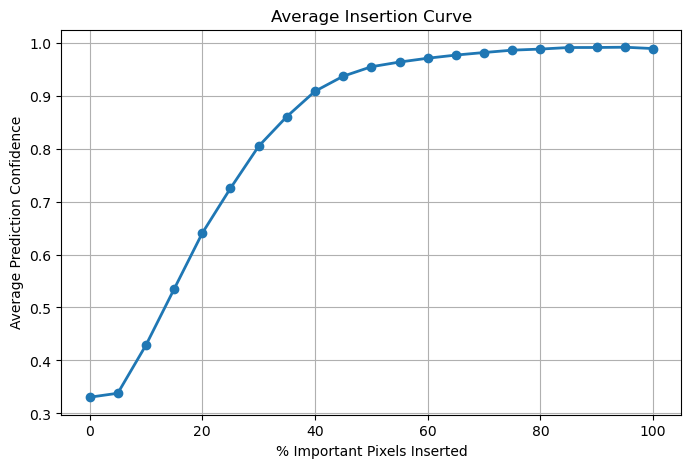

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

steps = 20
num_images = len(test_dataset)

mean_curve = np.zeros(steps + 1)

for idx in tqdm(range(num_images)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(1).item()

  

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam_pp(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    cam_flat = grayscale_cam.flatten()

    sorted_idx = np.argsort(cam_flat)[::-1]

    h, w = grayscale_cam.shape

    confidences = []

   

    for step in range(steps + 1):

        frac = step / steps

        modified_img = torch.full_like(img, -3)

        n_pixels = int(frac * len(sorted_idx))

        pixels_to_insert = sorted_idx[:n_pixels]

        rows = pixels_to_insert // w
        cols = pixels_to_insert % w

        modified_img[:, rows, cols] = img[:, rows, cols]

        modified_input = modified_img.unsqueeze(0).to(device)

        with torch.no_grad():

            output = model(modified_input)

            prob = torch.softmax(
                output,
                dim=1
            )[0, pred_class]

            confidences.append(prob.item())

    mean_curve += np.array(confidences)



mean_curve /= num_images


x = np.linspace(0, 1, steps + 1)

insertion_auc = np.trapz(mean_curve, x)

print(f"Insertion AUC: {insertion_auc:.4f}")


plt.figure(figsize=(8,5))

plt.plot(
    x * 100,
    mean_curve,
    marker="o",
    linewidth=2
)

plt.xlabel("% Important Pixels Inserted")
plt.ylabel("Average Prediction Confidence")
plt.title("Average Insertion Curve")

plt.grid(True)

plt.show()

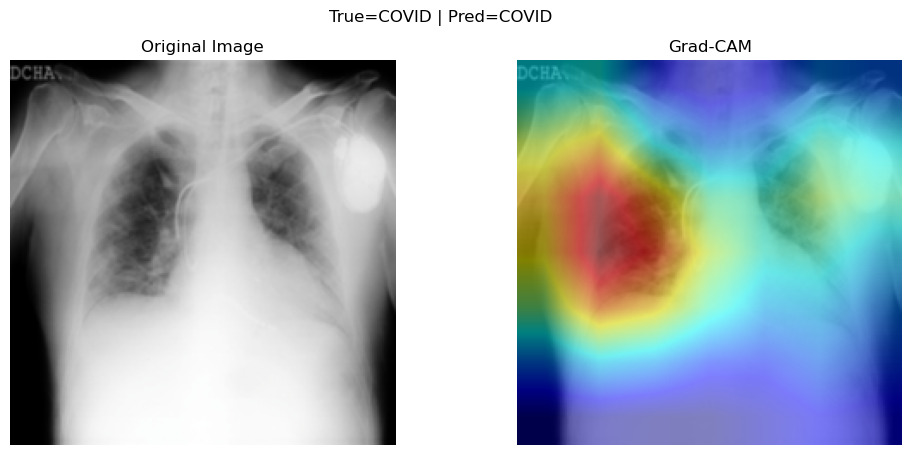

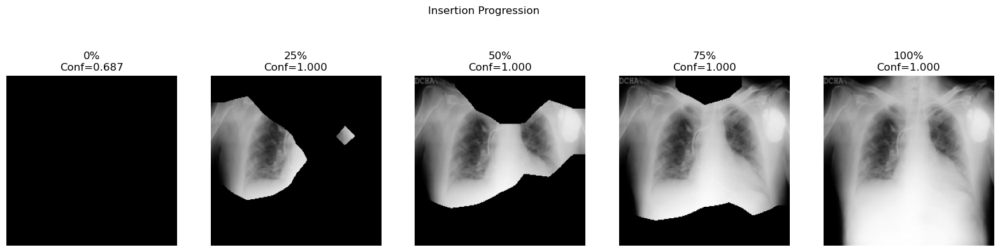

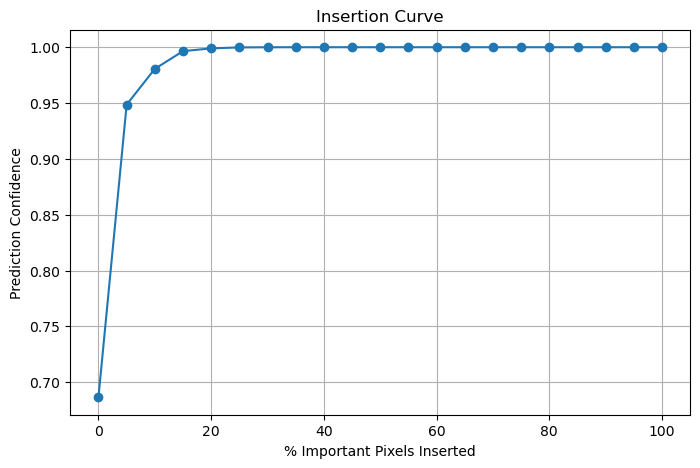

Initial Confidence: 0.6865
Final Confidence: 1.0000


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image



idx = 72

img, label = test_dataset[idx]

input_tensor = img.unsqueeze(0).to(device)

with torch.no_grad():
    logits = model(input_tensor)
    pred_class = logits.argmax(1).item()



targets = [ClassifierOutputTarget(pred_class)]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)[0]



mean = np.array([0.485,0.456,0.406])
std  = np.array([0.229,0.224,0.225])

rgb_img = img.permute(1,2,0).cpu().numpy()
rgb_img = rgb_img * std + mean
rgb_img = np.clip(rgb_img,0,1)

gradcam_vis = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)



cam_flat = grayscale_cam.flatten()

sorted_idx = np.argsort(cam_flat)[::-1]

h, w = grayscale_cam.shape


steps = 20

confidences = []

snapshots = {}

for step in range(steps + 1):

    frac = step / steps

    
    modified_img = torch.full_like(img, -3)

    n_pixels = int(frac * len(sorted_idx))

    pixels_to_insert = sorted_idx[:n_pixels]

    rows = pixels_to_insert // w
    cols = pixels_to_insert % w

    modified_img[:, rows, cols] = img[:, rows, cols]

    modified_input = modified_img.unsqueeze(0).to(device)

    with torch.no_grad():

        output = model(modified_input)

        prob = torch.softmax(
            output,
            dim=1
        )[0, pred_class]

        confidences.append(prob.item())

    if step in [0,5,10,15,20]:

        snap_rgb = modified_img.permute(1,2,0).cpu().numpy()

        snap_rgb = snap_rgb * std + mean
        snap_rgb = np.clip(snap_rgb,0,1)

        snapshots[step] = (
            snap_rgb,
            prob.item()
        )



fig, ax = plt.subplots(1,2,figsize=(12,5))

ax[0].imshow(rgb_img)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(gradcam_vis)
ax[1].set_title("Grad-CAM")
ax[1].axis("off")

plt.suptitle(
    f"True={train_dataset.classes[label]} | "
    f"Pred={train_dataset.classes[pred_class]}"
)

plt.show()



fig, axes = plt.subplots(
    1,
    5,
    figsize=(20,5)
)

titles = {
    0: "0%",
    5: "25%",
    10: "50%",
    15: "75%",
    20: "100%"
}

for ax, step in zip(axes, [0,5,10,15,20]):

    image, conf = snapshots[step]

    ax.imshow(image)

    ax.set_title(
        f"{titles[step]}\nConf={conf:.3f}"
    )

    ax.axis("off")

plt.suptitle("Insertion Progression")

plt.show()



x = np.linspace(
    0,
    100,
    steps + 1
)

plt.figure(figsize=(8,5))

plt.plot(
    x,
    confidences,
    marker="o"
)

plt.xlabel("% Important Pixels Inserted")
plt.ylabel("Prediction Confidence")
plt.title("Insertion Curve")

plt.grid(True)

plt.show()

print(
    f"Initial Confidence: {confidences[0]:.4f}"
)

print(
    f"Final Confidence: {confidences[-1]:.4f}"
)

In [39]:
from pytorch_grad_cam import GradCAMPlusPlus

cam_pp = GradCAMPlusPlus(
    model=model,
    target_layers=target_layers
)

In [38]:
targets = [ClassifierOutputTarget(pred_class)]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)[0]

grayscale_cam_pp = cam_pp(
    input_tensor=input_tensor,
    targets=targets
)[0]

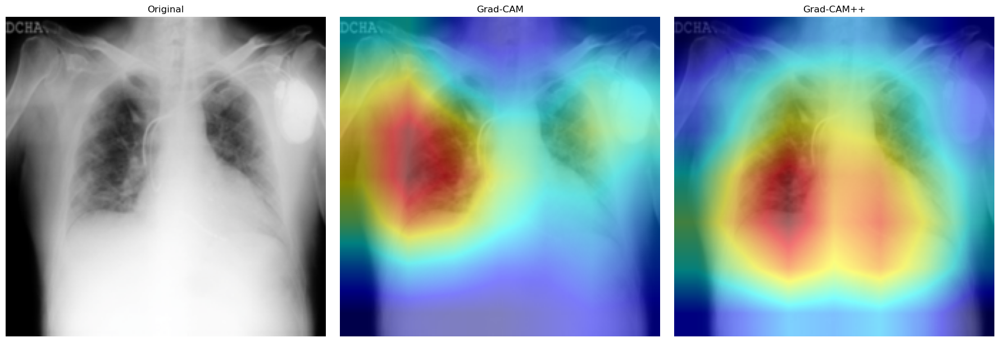

In [26]:
vis_cam = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)

vis_cam_pp = show_cam_on_image(
    rgb_img,
    grayscale_cam_pp,
    use_rgb=True
)

fig, ax = plt.subplots(1,3,figsize=(18,6))

ax[0].imshow(rgb_img)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(vis_cam)
ax[1].set_title("Grad-CAM")
ax[1].axis("off")

ax[2].imshow(vis_cam_pp)
ax[2].set_title("Grad-CAM++")
ax[2].axis("off")

plt.tight_layout()
plt.show()

In [22]:
entropy_cam = compute_entropy(grayscale_cam)
entropy_campp = compute_entropy(grayscale_cam_pp)

print(f"Grad-CAM Entropy    : {entropy_cam:.4f}")
print(f"Grad-CAM++ Entropy  : {entropy_campp:.4f}")

Grad-CAM Entropy    : 15.4059
Grad-CAM++ Entropy  : 15.3963


In [66]:
entropies = []

for idx in range(435):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_class = model(input_tensor).argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam_pp = cam_pp(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    entropies.append(
        compute_entropy(grayscale_cam_pp)
    )

print("Average Entropy:", np.mean(entropies))
print("Std Entropy:", np.std(entropies))

Average Entropy: 15.315117138591809
Std Entropy: 0.1080303109915451


In [67]:
import numpy as np

class_entropies = {
    0: [],  # COVID
    1: [],  # Normal
    2: []   # Viral Pneumonia
}

for idx in range(len(test_dataset)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_class = model(input_tensor).argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    entropy = compute_entropy(grayscale_cam)

    class_entropies[label].append(entropy)

for cls, values in class_entropies.items():

    print(
        f"{train_dataset.classes[cls]} : "
        f"{np.mean(values):.4f} ± {np.std(values):.4f}"
    )

COVID : 15.2655 ± 0.1539
Normal : 15.1823 ± 0.1793
Viral Pneumonia : 15.3685 ± 0.0810


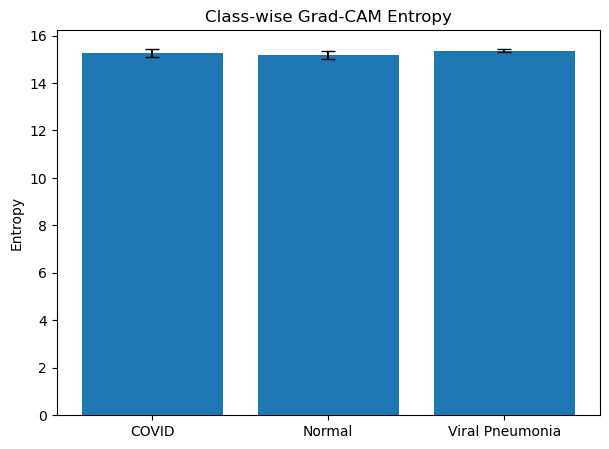

In [68]:
means = [
    np.mean(class_entropies[i])
    for i in range(3)
]

stds = [
    np.std(class_entropies[i])
    for i in range(3)
]

labels = train_dataset.classes

plt.figure(figsize=(7,5))

plt.bar(
    labels,
    means,
    yerr=stds,
    capsize=5
)

plt.ylabel("Entropy")
plt.title("Class-wise Grad-CAM Entropy")

plt.show()

  0%|          | 0/435 [00:00<?, ?it/s]C:\Users\sidha\AppData\Local\Temp\ipykernel_11312\3808013064.py:100: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  image_auc = np.trapz(confidences, x)
100%|██████████| 435/435 [04:17<00:00,  1.69it/s]


Class-wise Deletion AUC

COVID : 0.9095 ± 0.1368
Normal : 0.2100 ± 0.0950
Viral Pneumonia : 0.3057 ± 0.0894


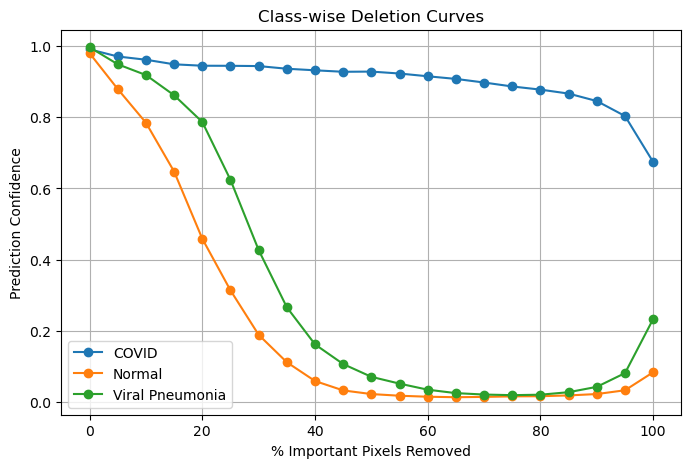

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

steps = 20
num_images = len(test_dataset)



class_curves = {
    0: [],
    1: [],
    2: []
}

class_aucs = {
    0: [],
    1: [],
    2: []
}


for idx in tqdm(range(num_images)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam_pp(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    cam_flat = grayscale_cam.flatten()

    sorted_idx = np.argsort(cam_flat)[::-1]

    h, w = grayscale_cam.shape

    confidences = []

   

    for step in range(steps + 1):

        frac = step / steps

        modified_img = img.clone()

        n_pixels = int(frac * len(sorted_idx))

        pixels_to_remove = sorted_idx[:n_pixels]

        rows = pixels_to_remove // w
        cols = pixels_to_remove % w

        modified_img[:, rows, cols] = -3

        modified_input = modified_img.unsqueeze(0).to(device)

        with torch.no_grad():

            output = model(modified_input)

            prob = torch.softmax(
                output,
                dim=1
            )[0, pred_class]

            confidences.append(prob.item())

    confidences = np.array(confidences)

    

    class_curves[label].append(confidences)

    

    x = np.linspace(0, 1, steps + 1)

    image_auc = np.trapz(confidences, x)

    class_aucs[label].append(image_auc)



print("\nClass-wise Deletion AUC\n")

for cls in range(3):

    mean_auc = np.mean(class_aucs[cls])
    std_auc = np.std(class_aucs[cls])

    print(
        f"{train_dataset.classes[cls]} : "
        f"{mean_auc:.4f} ± {std_auc:.4f}"
    )



plt.figure(figsize=(8,5))

x = np.linspace(0,100,steps+1)

for cls in range(3):

    mean_curve = np.mean(
        class_curves[cls],
        axis=0
    )

    plt.plot(
        x,
        mean_curve,
        marker='o',
        label=train_dataset.classes[cls]
    )

plt.xlabel("% Important Pixels Removed")
plt.ylabel("Prediction Confidence")
plt.title("Class-wise Deletion Curves")

plt.legend()
plt.grid(True)

plt.show()

  0%|          | 0/435 [00:00<?, ?it/s]C:\Users\sidha\AppData\Local\Temp\ipykernel_11312\4248364236.py:102: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  image_auc = np.trapz(confidences, x)
100%|██████████| 435/435 [03:41<00:00,  1.97it/s]


Class-wise Insertion AUC

COVID : 0.9772 ± 0.0748
Normal : 0.7567 ± 0.1376
Viral Pneumonia : 0.7719 ± 0.0852


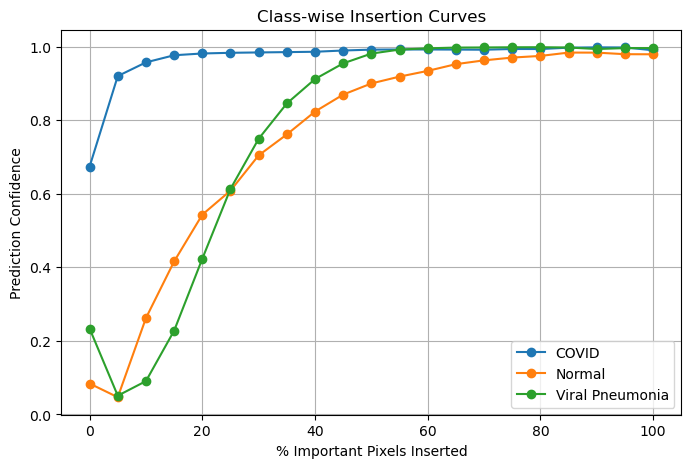

In [70]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

steps = 20
num_images = len(test_dataset)



class_curves = {
    0: [],
    1: [],
    2: []
}

class_aucs = {
    0: [],
    1: [],
    2: []
}


for idx in tqdm(range(num_images)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    cam_flat = grayscale_cam.flatten()

    sorted_idx = np.argsort(cam_flat)[::-1]

    h, w = grayscale_cam.shape

    confidences = []

    
    for step in range(steps + 1):

        frac = step / steps

        # Start from blank image
        modified_img = torch.full_like(img, -3)

        n_pixels = int(frac * len(sorted_idx))

        pixels_to_insert = sorted_idx[:n_pixels]

        rows = pixels_to_insert // w
        cols = pixels_to_insert % w

 
        modified_img[:, rows, cols] = img[:, rows, cols]

        modified_input = modified_img.unsqueeze(0).to(device)

        with torch.no_grad():

            output = model(modified_input)

            prob = torch.softmax(
                output,
                dim=1
            )[0, pred_class]

            confidences.append(prob.item())

    confidences = np.array(confidences)

   

    class_curves[label].append(confidences)

 

    x = np.linspace(0, 1, steps + 1)

    image_auc = np.trapz(confidences, x)

    class_aucs[label].append(image_auc)



print("\nClass-wise Insertion AUC\n")

for cls in range(3):

    mean_auc = np.mean(class_aucs[cls])
    std_auc = np.std(class_aucs[cls])

    print(
        f"{train_dataset.classes[cls]} : "
        f"{mean_auc:.4f} ± {std_auc:.4f}"
    )



plt.figure(figsize=(8,5))

x = np.linspace(0,100,steps+1)

for cls in range(3):

    mean_curve = np.mean(
        class_curves[cls],
        axis=0
    )

    plt.plot(
        x,
        mean_curve,
        marker='o',
        label=train_dataset.classes[cls]
    )

plt.xlabel("% Important Pixels Inserted")
plt.ylabel("Prediction Confidence")
plt.title("Class-wise Insertion Curves")

plt.legend()
plt.grid(True)

plt.show()

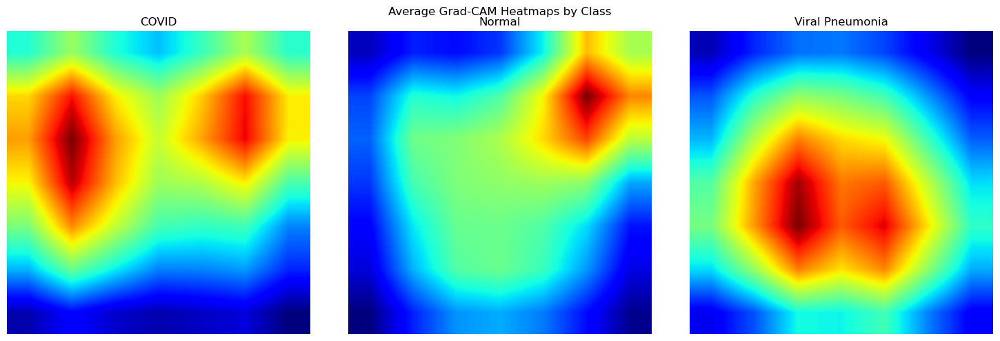

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

avg_maps = {
    0: [],
    1: [],
    2: []
}

for idx in range(len(test_dataset)):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_class = model(input_tensor).argmax(1).item()

    targets = [ClassifierOutputTarget(pred_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    cam_norm = grayscale_cam / (
    grayscale_cam.max() + 1e-8
)
    avg_maps[label].append(cam_norm)



mean_heatmaps = {}

for cls in range(3):

    mean_heatmaps[cls] = np.mean(
        avg_maps[cls],
        axis=0
    )



fig, axes = plt.subplots(
    1,
    3,
    figsize=(15,5)
)

for cls in range(3):

    axes[cls].imshow(
        mean_heatmaps[cls],
        cmap="jet"
    )

    axes[cls].set_title(
        train_dataset.classes[cls]
    )

    axes[cls].axis("off")

plt.suptitle(
    "Average Grad-CAM Heatmaps by Class"
)

plt.tight_layout()

plt.show()

In [72]:
%pip install lime scikit-image


  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
   -- ------------------------------------- 0.8/12.8 MB 6.7 MB/s eta 0:00:02
   ----- ---------------------------------- 1.8/12.8 MB 4.4 MB/s eta 0:00:03
   --------- ------------------------------ 3.1/12.8 MB 5.1 MB/s eta 0:00:02
   -------------- ------------------------- 4.7/12.8 MB 5.8 MB/s eta 0:00:02
   ------------------ --------------------- 6.0/12.8 MB 6.0 MB/s eta 0:00:02
   ------------------------ --------------- 7.9/12.8 MB 6.3 MB/s eta 0:00:01
   --------------------------- ------------ 8.9/12.8 MB 6.1 MB/s eta 0:00:01
   ------------------------------- -------- 10.0/12.8 MB 6.0 

In [14]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

import numpy as np
import matplotlib.pyplot as plt
import torch

d:\Conda\envs\EDU\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:
def predict_fn(images):

    batch = []

    mean = np.array([0.485,0.456,0.406])
    std  = np.array([0.229,0.224,0.225])

    for img in images:

        img = (img - mean) / std

        img = torch.tensor(
            img,
            dtype=torch.float32
        ).permute(2,0,1)

        batch.append(img)

    batch = torch.stack(batch).to(device)

    with torch.no_grad():

        outputs = model(batch)

        probs = torch.softmax(
            outputs,
            dim=1
        )

    return probs.cpu().numpy()

100%|██████████| 250/250 [00:01<00:00, 144.07it/s]


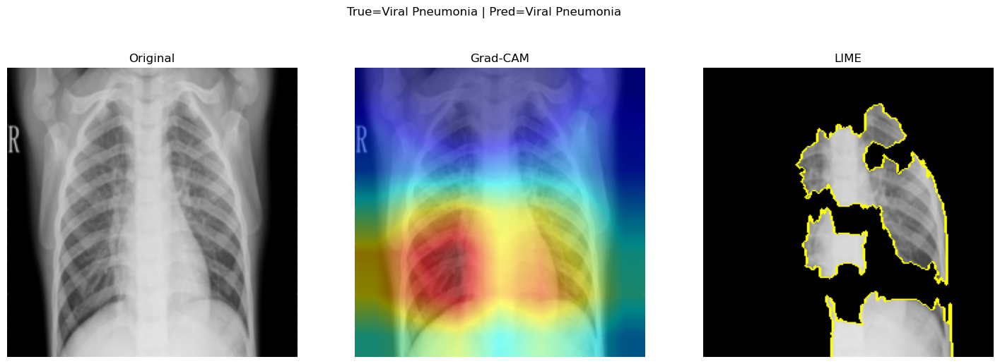

In [34]:
idx = 390

img, label = test_dataset[idx]

input_tensor = img.unsqueeze(0).to(device)

with torch.no_grad():

    output = model(input_tensor)

    pred_class = output.argmax(1).item()
targets = [ClassifierOutputTarget(pred_class)]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)[0]

gradcam_vis = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)
explainer = lime_image.LimeImageExplainer()

explanation = explainer.explain_instance(
    rgb_img,
    predict_fn,
    top_labels=3,
    hide_color=0,
    num_samples=250
)
lime_img, lime_mask = explanation.get_image_and_mask(
    pred_class,
    positive_only=True,
    num_features=10,
    hide_rest=True
)

lime_vis = mark_boundaries(
    lime_img,
    lime_mask
)
fig, ax = plt.subplots(
    1,
    3,
    figsize=(18,6)
)

ax[0].imshow(rgb_img)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(gradcam_vis)
ax[1].set_title("Grad-CAM")
ax[1].axis("off")

ax[2].imshow(lime_vis)
ax[2].set_title("LIME")
ax[2].axis("off")

plt.suptitle(
    f"True={train_dataset.classes[label]} | "
    f"Pred={train_dataset.classes[pred_class]}"
)

plt.show()

In [12]:
def lime_to_mask(explanation, pred_class):

    mask = np.zeros_like(
        explanation.segments,
        dtype=np.float32
    )

    for seg_id, weight in explanation.local_exp[pred_class]:

        if weight > 0:

            mask[
                explanation.segments == seg_id
            ] = weight

    mask = (
        mask - mask.min()
    ) / (
        mask.max() - mask.min() + 1e-8
    )

    return mask

In [ ]:
lime_entropies = []

N = 40
from tqdm import tqdm
for idx in tqdm(range(N)):

    img, label = test_dataset[idx]

    input_tensor = (
        img.unsqueeze(0)
           .to(device)
    )

    with torch.no_grad():

        output = model(input_tensor)

        pred_class = (
            output.argmax(1)
                  .item()
        )

    rgb_img = (
        img.permute(1,2,0)
           .cpu()
           .numpy()
    )

    rgb_img = rgb_img * std + mean
    rgb_img = np.clip(rgb_img,0,1)

    explanation = explainer.explain_instance(
        rgb_img,
        predict_fn,
        top_labels=3,
        hide_color=0,
        num_samples=1000
    )

    mask = lime_to_mask(
        explanation,
        pred_class
    )

    lime_entropies.append(
        compute_entropy(mask)
    )

print(
    "LIME Entropy:",
    np.mean(lime_entropies),
    "±",
    np.std(lime_entropies)
)

100%|██████████| 10/10 [01:16<00:00,  7.62s/it]

LIME Entropy: 14.220407194251809 ± 0.3380221494535356


In [ ]:
steps = 20

N = 100
mean_curve = np.zeros(
    steps + 1
)

for idx in tqdm(range(N)):
    

    img, label = test_dataset[idx]

    input_tensor = (
        img.unsqueeze(0)
           .to(device)
    )

    with torch.no_grad():

        output = model(input_tensor)

        pred_class = (
            output.argmax(1)
                  .item()
        )

    rgb_img = (
        img.permute(1,2,0)
           .cpu()
           .numpy()
    )

    rgb_img = rgb_img * std + mean
    rgb_img = np.clip(rgb_img,0,1)

    explanation = explainer.explain_instance(
        rgb_img,
        predict_fn,
        top_labels=3,
        hide_color=0,
        num_samples=300
    )

    ranked_segments = sorted(
        explanation.local_exp[pred_class],
        key=lambda x: x[1],
        reverse=True
    )

    confidences = []

    for step in range(
        steps + 1
    ):

        frac = step / steps

        modified_img = img.clone()

        n_remove = int(
            frac *
            len(ranked_segments)
        )

        remove_segments = [
            seg_id
            for seg_id, _
            in ranked_segments[:n_remove]
        ]

        for seg_id in remove_segments:

            seg_mask = (
                explanation.segments
                == seg_id
            )

            modified_img[
                :,
                seg_mask
            ] = -3

        with torch.no_grad():

            prob = torch.softmax(
                model(
                    modified_img
                    .unsqueeze(0)
                    .to(device)
                ),
                dim=1
            )[0,pred_class]

        confidences.append(
            prob.item()
        )

    mean_curve += np.array(
        confidences
    )

mean_curve /= N

x = np.linspace(
    0,
    1,
    steps + 1
)

lime_auc = np.trapz(
    mean_curve,
    x
)

print(
    f"LIME Deletion AUC: {lime_auc:.4f}"
)

100%|██████████| 100/100 [05:00<00:00,  3.01s/it]

LIME Deletion AUC: 0.9700



C:\Users\sidha\AppData\Local\Temp\ipykernel_14424\4212429075.py:109: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lime_auc = np.trapz(


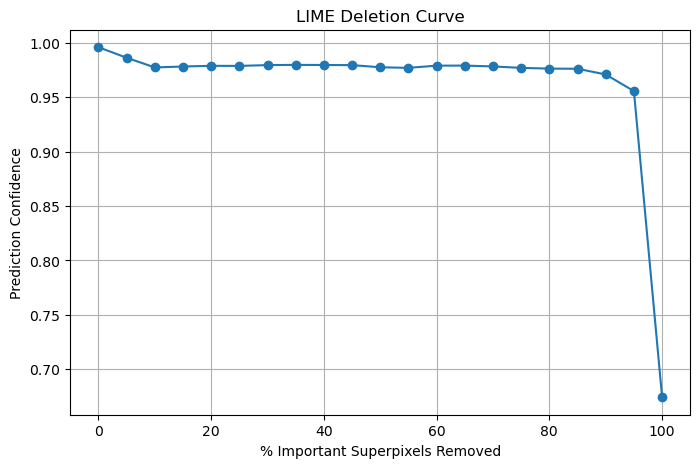

In [25]:
plt.figure(figsize=(8,5))

plt.plot(
    x * 100,
    mean_curve,
    marker="o"
)

plt.xlabel(
    "% Important Superpixels Removed"
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "LIME Deletion Curve"
)

plt.grid(True)

plt.show()

100%|██████████| 300/300 [00:02<00:00, 123.18it/s]


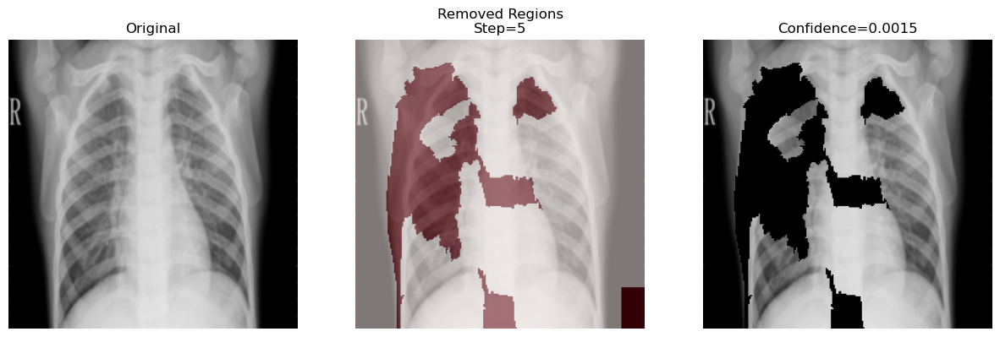

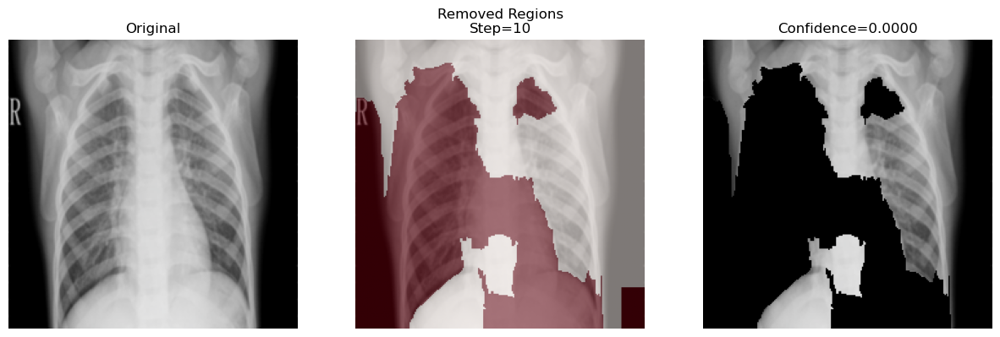

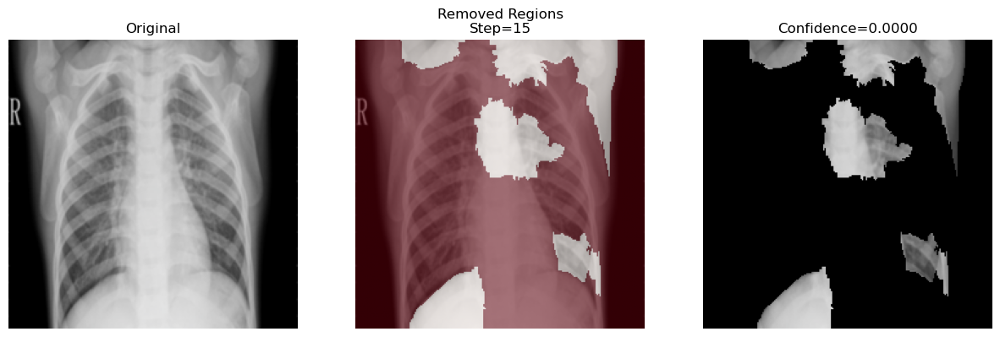

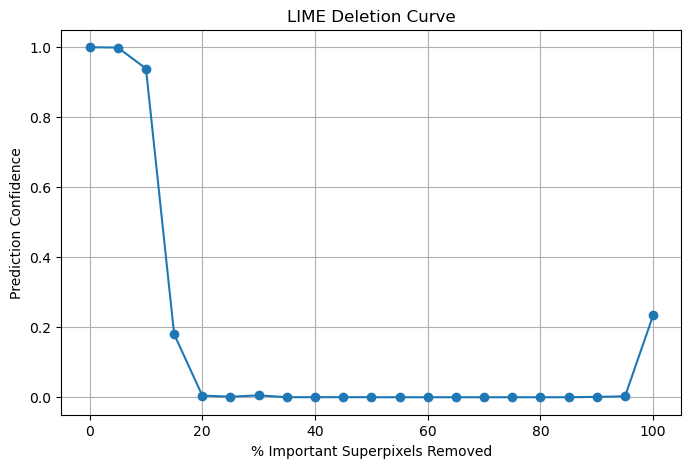

In [ ]:
steps = 20

img, label = test_dataset[400]

input_tensor = img.unsqueeze(0).to(device)

with torch.no_grad():

    output = model(input_tensor)

    pred_class = output.argmax(1).item()



rgb_img = (
    img.permute(1,2,0)
       .cpu()
       .numpy()
)

rgb_img = rgb_img * std + mean
rgb_img = np.clip(rgb_img, 0, 1)



explainer = lime_image.LimeImageExplainer()

explanation = explainer.explain_instance(
    rgb_img,
    predict_fn,
    top_labels=3,
    hide_color=0,
    num_samples=300
)



ranked_segments = sorted(
    explanation.local_exp[pred_class],
    key=lambda x: x[1],
    reverse=True
)

confidences = []



for step in range(steps + 1):

    frac = step / steps

    modified_img = img.clone()

    n_remove = int(
        frac * len(ranked_segments)
    )

    remove_segments = [
        seg_id
        for seg_id, _
        in ranked_segments[:n_remove]
    ]



    for seg_id in remove_segments:

        seg_mask = (
            explanation.segments
            == seg_id
        )

        modified_img[:, seg_mask] = -3


    with torch.no_grad():

        prob = torch.softmax(
            model(
                modified_img
                .unsqueeze(0)
                .to(device)
            ),
            dim=1
        )[0, pred_class]

    confidences.append(prob.item())



    if step in [ 5, 10, 15]:

        vis_mask = np.zeros_like(
            explanation.segments,
            dtype=np.uint8
        )

        for seg_id in remove_segments:

            vis_mask[
                explanation.segments == seg_id
            ] = 1

        fig, ax = plt.subplots(
            1,
            3,
            figsize=(15,5)
        )

        ax[0].imshow(rgb_img)
        ax[0].set_title("Original")
        ax[0].axis("off")

        ax[1].imshow(rgb_img)
        ax[1].imshow(
            vis_mask,
            cmap="Reds",
            alpha=0.5
        )
        ax[1].set_title(
            f"Removed Regions\nStep={step}"
        )
        ax[1].axis("off")

        modified_vis = (
            modified_img
            .permute(1,2,0)
            .cpu()
            .numpy()
        )

        modified_vis = (
            modified_vis * std + mean
        )

        modified_vis = np.clip(
            modified_vis,
            0,
            1
        )

        ax[2].imshow(modified_vis)
        ax[2].set_title(
            f"Confidence={prob:.4f}"
        )
        ax[2].axis("off")

        plt.show()



x = np.linspace(
    0,
    100,
    steps + 1
)

plt.figure(figsize=(8,5))

plt.plot(
    x,
    confidences,
    marker="o"
)

plt.xlabel(
    "% Important Superpixels Removed"
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "LIME Deletion Curve"
)

plt.grid(True)

plt.show()

100%|██████████| 50/50 [02:35<00:00,  3.10s/it]
C:\Users\sidha\AppData\Local\Temp\ipykernel_20092\4205155242.py:146: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lime_deletion_auc = np.trapz(


LIME Entropy: 15.0026 ± 0.6107
LIME Deletion AUC: 0.2949


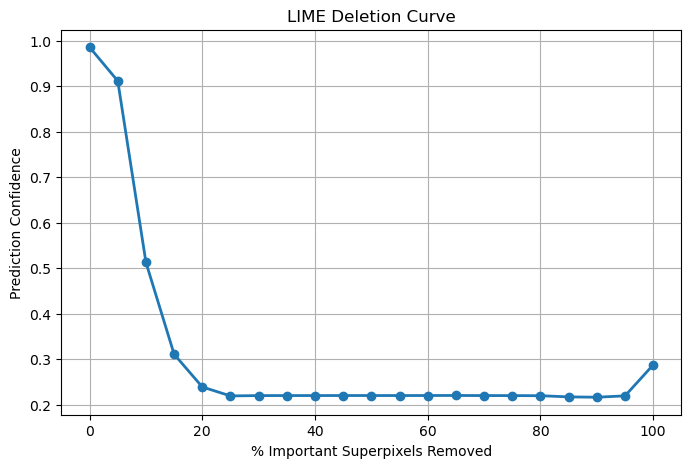

In [35]:
steps = 20
import random
from tqdm import tqdm
N = 50

sample_indices = random.sample(
    range(len(test_dataset)),
    N
)
mean_curve = np.zeros(steps + 1)
all_entropies = []

for idx in tqdm(sample_indices):

    img, label = test_dataset[idx]

    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():

        output = model(input_tensor)

        pred_class = output.argmax(1).item()

    # =====================================
    # Convert to RGB
    # =====================================

    rgb_img = (
        img.permute(1,2,0)
           .cpu()
           .numpy()
    )

    rgb_img = rgb_img * std + mean
    rgb_img = np.clip(rgb_img, 0, 1)

    # =====================================
    # LIME
    # =====================================

    explanation = explainer.explain_instance(
        rgb_img,
        predict_fn,
        top_labels=3,
        hide_color=0,
        num_samples=250
    )

    # =====================================
    # Entropy Mask
    # =====================================

    entropy_mask = np.zeros_like(
        explanation.segments,
        dtype=np.float32
    )

    for seg_id, weight in explanation.local_exp[pred_class]:

        if weight > 0:

            entropy_mask[
                explanation.segments == seg_id
            ] = weight

    entropy_mask = (
        entropy_mask - entropy_mask.min()
    ) / (
        entropy_mask.max() - entropy_mask.min() + 1e-8
    )

    all_entropies.append(
        compute_entropy(entropy_mask)
    )

    # =====================================
    # Ranked Superpixels
    # =====================================

    ranked_segments = sorted(
        explanation.local_exp[pred_class],
        key=lambda x: x[1],
        reverse=True
    )

    confidences = []

    for step in range(steps + 1):

        frac = step / steps

        modified_img = img.clone()

        n_remove = int(
            frac * len(ranked_segments)
        )

        remove_segments = [
            seg_id
            for seg_id, _
            in ranked_segments[:n_remove]
        ]

        for seg_id in remove_segments:

            seg_mask = (
                explanation.segments
                == seg_id
            )

            modified_img[
                :,
                seg_mask
            ] = -3

        with torch.no_grad():

            prob = torch.softmax(
                model(
                    modified_img
                    .unsqueeze(0)
                    .to(device)
                ),
                dim=1
            )[0, pred_class]

        confidences.append(
            prob.item()
        )

    mean_curve += np.array(confidences)

# =====================================
# Dataset Metrics
# =====================================

mean_curve /= N

x = np.linspace(
    0,
    1,
    steps + 1
)

lime_deletion_auc = np.trapz(
    mean_curve,
    x
)

print(
    f"LIME Entropy: "
    f"{np.mean(all_entropies):.4f} ± "
    f"{np.std(all_entropies):.4f}"
)

print(
    f"LIME Deletion AUC: "
    f"{lime_deletion_auc:.4f}"
)

# =====================================
# Plot
# =====================================

plt.figure(figsize=(8,5))

plt.plot(
    x * 100,
    mean_curve,
    marker="o",
    linewidth=2
)

plt.xlabel(
    "% Important Superpixels Removed"
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "LIME Deletion Curve"
)

plt.grid(True)

plt.show()

In [36]:
original_conf = mean_curve[0]

lime_aopc = np.mean(
    original_conf - mean_curve[1:]
)

print(
    f"LIME AOPC = {lime_aopc:.4f}"
)

LIME AOPC = 0.7083


100%|██████████| 50/50 [02:09<00:00,  2.60s/it]
C:\Users\sidha\AppData\Local\Temp\ipykernel_20092\3556814315.py:220: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  lime_dauc = np.trapz(
C:\Users\sidha\AppData\Local\Temp\ipykernel_20092\3556814315.py:254: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  cls_dauc = np.trapz(


LIME Entropy: 14.5935 ± 2.1877
LIME DAUC: 0.4028
LIME AOPC: 0.5823

Class-wise Metrics
COVID | DAUC=0.9369 | AOPC=0.0553
Normal | DAUC=0.0936 | AOPC=0.8448
Viral Pneumonia | DAUC=0.1102 | AOPC=0.9088


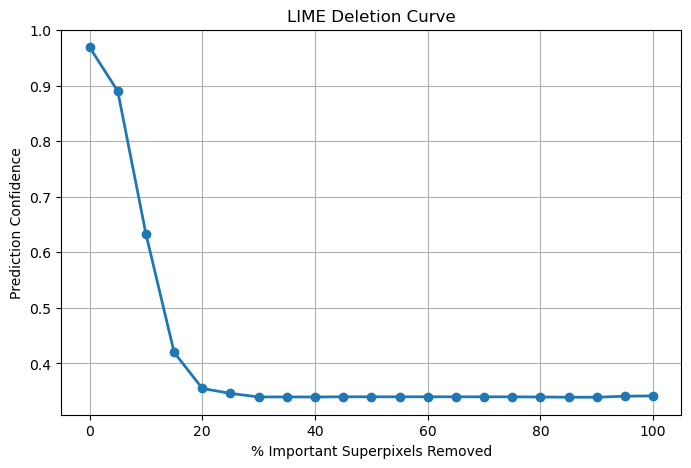

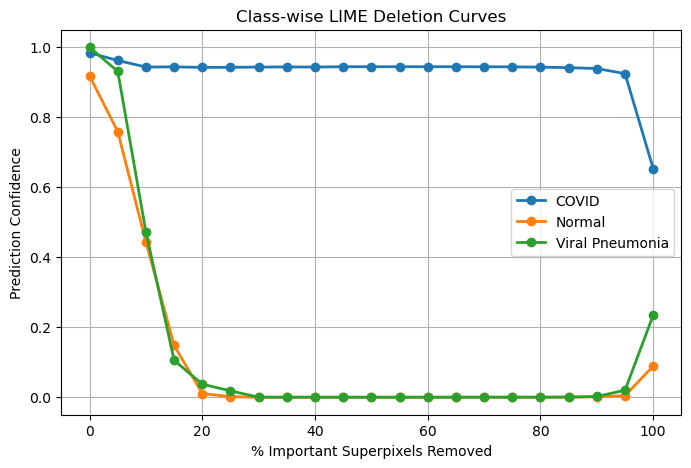

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
import random

steps = 20
N = 50

sample_indices = random.sample(
    range(len(test_dataset)),
    N
)

mean_curve = np.zeros(
    steps + 1
)

all_entropies = []

class_curves = {
    0: [],
    1: [],
    2: []
}

for idx in tqdm(sample_indices):

    img, label = test_dataset[idx]

    input_tensor = (
        img.unsqueeze(0)
           .to(device)
    )

    with torch.no_grad():

        output = model(
            input_tensor
        )

        pred_class = (
            output.argmax(1)
                  .item()
        )

    # =====================================
    # Convert to RGB
    # =====================================

    rgb_img = (
        img.permute(1,2,0)
           .cpu()
           .numpy()
    )

    rgb_img = (
        rgb_img * std
        + mean
    )

    rgb_img = np.clip(
        rgb_img,
        0,
        1
    )

    # =====================================
    # LIME
    # =====================================

    explanation = explainer.explain_instance(
        rgb_img,
        predict_fn,
        top_labels=3,
        hide_color=0,
        num_samples=250
    )

    # =====================================
    # Entropy
    # =====================================

    entropy_mask = np.zeros_like(
        explanation.segments,
        dtype=np.float32
    )

    for seg_id, weight in explanation.local_exp[pred_class]:

        if weight > 0:

            entropy_mask[
                explanation.segments
                == seg_id
            ] = weight

    entropy_mask = (
        entropy_mask
        - entropy_mask.min()
    ) / (
        entropy_mask.max()
        - entropy_mask.min()
        + 1e-8
    )

    all_entropies.append(
        compute_entropy(
            entropy_mask
        )
    )

    # =====================================
    # Ranked Segments
    # =====================================

    ranked_segments = sorted(
        explanation.local_exp[pred_class],
        key=lambda x: x[1],
        reverse=True
    )

    confidences = []

    # =====================================
    # Deletion Curve
    # =====================================

    for step in range(
        steps + 1
    ):

        frac = (
            step / steps
        )

        modified_img = (
            img.clone()
        )

        n_remove = int(
            frac *
            len(ranked_segments)
        )

        remove_segments = [

            seg_id

            for seg_id, _

            in ranked_segments[
                :n_remove
            ]
        ]

        for seg_id in remove_segments:

            seg_mask = (
                explanation.segments
                == seg_id
            )

            modified_img[
                :,
                seg_mask
            ] = -3

        with torch.no_grad():

            prob = torch.softmax(

                model(
                    modified_img
                    .unsqueeze(0)
                    .to(device)
                ),

                dim=1

            )[0, pred_class]

        confidences.append(
            prob.item()
        )

    confidences = np.array(
        confidences
    )

    mean_curve += confidences

    class_curves[label].append(
        confidences
    )

# =====================================
# Dataset Averages
# =====================================

mean_curve /= N

for cls in class_curves:

    class_curves[cls] = np.mean(
        class_curves[cls],
        axis=0
    )

x = np.linspace(
    0,
    1,
    steps + 1
)

# =====================================
# Metrics
# =====================================

lime_dauc = np.trapz(
    mean_curve,
    x
)

lime_aopc = np.mean(
    mean_curve[0]
    - mean_curve[1:]
)

print(
    f"LIME Entropy: "
    f"{np.mean(all_entropies):.4f} ± "
    f"{np.std(all_entropies):.4f}"
)

print(
    f"LIME DAUC: "
    f"{lime_dauc:.4f}"
)

print(
    f"LIME AOPC: "
    f"{lime_aopc:.4f}"
)

# =====================================
# Class-wise Metrics
# =====================================

print("\nClass-wise Metrics")

for cls in class_curves:

    cls_dauc = np.trapz(
        class_curves[cls],
        x
    )

    cls_aopc = np.mean(
        class_curves[cls][0]
        - class_curves[cls][1:]
    )

    print(
        f"{test_dataset.classes[cls]}"
        f" | DAUC={cls_dauc:.4f}"
        f" | AOPC={cls_aopc:.4f}"
    )



plt.figure(
    figsize=(8,5)
)

plt.plot(
    x * 100,
    mean_curve,
    marker="o",
    linewidth=2
)

plt.xlabel(
    "% Important Superpixels Removed"
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "LIME Deletion Curve"
)

plt.grid(True)

plt.show()



plt.figure(
    figsize=(8,5)
)

for cls in class_curves:

    plt.plot(
        x * 100,
        class_curves[cls],
        marker="o",
        linewidth=2,
        label=test_dataset.classes[cls]
    )

plt.xlabel(
    "% Important Superpixels Removed"
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "Class-wise LIME Deletion Curves"
)

plt.legend()

plt.grid(True)

plt.show()

In [24]:
misclassified = []

model.eval()

with torch.no_grad():

    for idx in range(len(test_dataset)):

        img, label = test_dataset[idx]

        output = model(
            img.unsqueeze(0).to(device)
        )

        pred = output.argmax(1).item()

        if pred != label:

            misclassified.append(
                (idx, label, pred)
            )

print(
    f"Misclassified: {len(misclassified)}"
)

misclassified[:10]

Misclassified: 6


[(29, 0, 1), (51, 0, 1), (125, 0, 1), (154, 1, 0), (163, 1, 2), (374, 2, 1)]

In [ ]:
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score
)

y_true = []
y_pred = []

model.eval()

with torch.no_grad():

    for img, label in test_dataset:

        output = model(
            img.unsqueeze(0).to(device)
        )

        pred = output.argmax(1).item()

        y_true.append(label)
        y_pred.append(pred)



acc = accuracy_score(
    y_true,
    y_pred
)

print(
    f"Accuracy: {acc:.4f}"
)



print(
    classification_report(
        y_true,
        y_pred,
        target_names=test_dataset.classes,
        digits=4
    )
)



cm = confusion_matrix(
    y_true,
    y_pred
)

print(cm)

Accuracy: 0.9862
                 precision    recall  f1-score   support

          COVID     0.9930    0.9793    0.9861       145
         Normal     0.9728    0.9862    0.9795       145
Viral Pneumonia     0.9931    0.9931    0.9931       145

       accuracy                         0.9862       435
      macro avg     0.9863    0.9862    0.9862       435
   weighted avg     0.9863    0.9862    0.9862       435

[[142   3   0]
 [  1 143   1]
 [  0   1 144]]
